# Data Preparation


In [1]:
import os
from IPython.display import display
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
from onekey_algo import OnekeyDS as okds
import pandas as pd

os.makedirs('img', exist_ok=True)
os.makedirs('results', exist_ok=True)
os.makedirs('features', exist_ok=True)

# Configuring the data directory （Spreadsheets include the combined model's training and validation cohorts, both internal and external, as well as the clinical model's training and validation cohorts, both internal and external）
feature_file = r'the path of your own data' 

# Corresponding label file (Spreadsheets include the model's training and validation cohorts, both internal and external)
label_file = r'the path of your own data'

# Loading the column names of the label file
labels = ['label']

# <span style="font-size: 20px; font-weight: bold;">Reading Data</span>
## <span style="font-size: 15px;">Data is stored in CSV format. The label_data should be in DataFrame format, including an ID column</span>

In [2]:
feature_data = pd.read_csv(feature_file)
display(feature_data)
label_data = pd.read_csv(label_file)
label_data.head()

,ID,StdDev of Lesion,Ten-min ratio,Diameter,AFP,PIVKA-II
0,ZS24194566.nii.gz,32.518,0.177,78,1,1
1,ZS24237975.nii.gz,30.995,0.514,71,1,1
2,ZS17148935.nii.gz,28.875,0.320,28,1,1
3,ZS24207337.nii.gz,29.647,0.853,26,1,1
4,ZS24221804.nii.gz,24.980,0.206,38,1,1
...,...,...,...,...,...,...
383,ZS11175196.nii.gz,27.555,0.862,55,0,0
384,ZS222564194.nii.gz,30.639,0.367,38,0,0
385,ZS222563212.nii.gz,33.368,0.583,44,0,0
386,ZS23076675.nii.gz,15.036,0.506,23,0,1


,ID,label,group
0,ZS24194566.nii.gz,1,val
1,ZS24237975.nii.gz,0,val
2,ZS17148935.nii.gz,0,val
3,ZS24207337.nii.gz,1,val
4,ZS24221804.nii.gz,0,val


# Feature Concatenation
## <span style="font-weight: normal;">Concatenate the labeled data label_data with rad_data to obtain the training data.</span>

In [3]:
from onekey_algo.custom.utils import print_join_info
# Remove the ID column.
print_join_info(feature_data, label_data)
combined_data = pd.merge(feature_data, label_data, on=['ID'], how='inner')
ids = combined_data['ID']
combined_data = combined_data.drop(['ID'], axis=1)
print(combined_data[labels].value_counts())
combined_data.columns

[2025-01-06 18:26:48 - <frozen onekey_algo.custom.utils>:  55]	INFO	ID特征完全匹配！


label
0        266
1        122
dtype: int64


Index(['StdDev of Lesion', 'Ten-min ratio', 'Diameter', 'AFP', 'PIVKA-II',
       'label', 'group'],
      dtype='object')

# Obtain the statistical information of the data
## <span style="font-weight: normal;">count: the number of samples.</span>
## <span style="font-weight: normal;">mean, std: the mean and standard deviation of the corresponding feature.</span>
## <span style="font-weight: normal;">min, 25%, 50%, 75%, max: the minimum value, 25th, 50th, 75th percentiles, and maximum value of the corresponding feature.</span>

In [4]:
combined_data.describe()

,StdDev of Lesion,Ten-min ratio,Diameter,AFP,PIVKA-II,label
count,388.000,388.000,388.000,388.000,388.000,388.000
mean,29.928,0.431,44.353,0.183,0.750,0.314
std,5.679,0.225,27.794,0.387,0.434,0.465
min,14.366,0.021,8.000,0.000,0.000,0.000
25%,26.588,0.228,24.000,0.000,0.750,0.000
50%,29.502,0.419,36.000,0.000,1.000,0.000
75%,33.125,0.594,58.000,0.000,1.000,1.000
max,49.466,1.008,163.000,1.000,1.000,1.000


# Normalization
## <span style="font-weight: normal;">normalize_df is the API for normalization in onekey, which transforms the data to have a mean of 0 and a standard deviation of 1. The method of normalization is:𝑐𝑜𝑙𝑢𝑚𝑛=（𝑐𝑜𝑙𝑢𝑚𝑛−𝑚𝑒𝑎𝑛）/𝑠𝑡𝑑</span>



In [5]:
from onekey_algo.custom.components.comp1 import normalize_df
data = normalize_df(combined_data, not_norm=labels, group='group')
data = data.dropna(axis=1)
data.describe()

,StdDev of Lesion,Ten-min ratio,Diameter,AFP,PIVKA-II,label
count,3.880e+02,3.880e+02,3.880e+02,3.880e+02,3.880e+02,388.000
mean,-1.145e-16,7.325e-17,-4.120e-17,7.325e-17,-5.494e-17,0.314
std,9.987e-01,9.987e-01,9.987e-01,9.987e-01,9.987e-01,0.465
min,-2.726e+00,-1.771e+00,-1.371e+00,-5.271e-01,-1.810e+00,0.000
25%,-5.894e-01,-8.655e-01,-7.267e-01,-4.569e-01,-1.737e-02,0.000
50%,-7.755e-02,-8.724e-02,-2.885e-01,-4.569e-01,5.839e-01,0.000
75%,5.676e-01,7.215e-01,4.858e-01,-4.569e-01,5.839e-01,1.000
max,3.286e+00,2.459e+00,4.088e+00,2.181e+00,5.839e-01,1.000


In [6]:
data.to_csv('data_features.csv',index=False)

# Calculate the correlation coefficient

In [7]:
pearson_corr = data[data['group'] == 'train'][[c for c in data.columns if c not in labels]].corr('pearson')
# kendall_corr = data[[c for c in data.columns if c not in labels]].corr('kendall')
# spearman_corr = data[[c for c in data.columns if c not in labels]].corr('spearman')

In [8]:
data.to_csv('corr_features.csv',index=False)

# Visualize the correlation coefficient

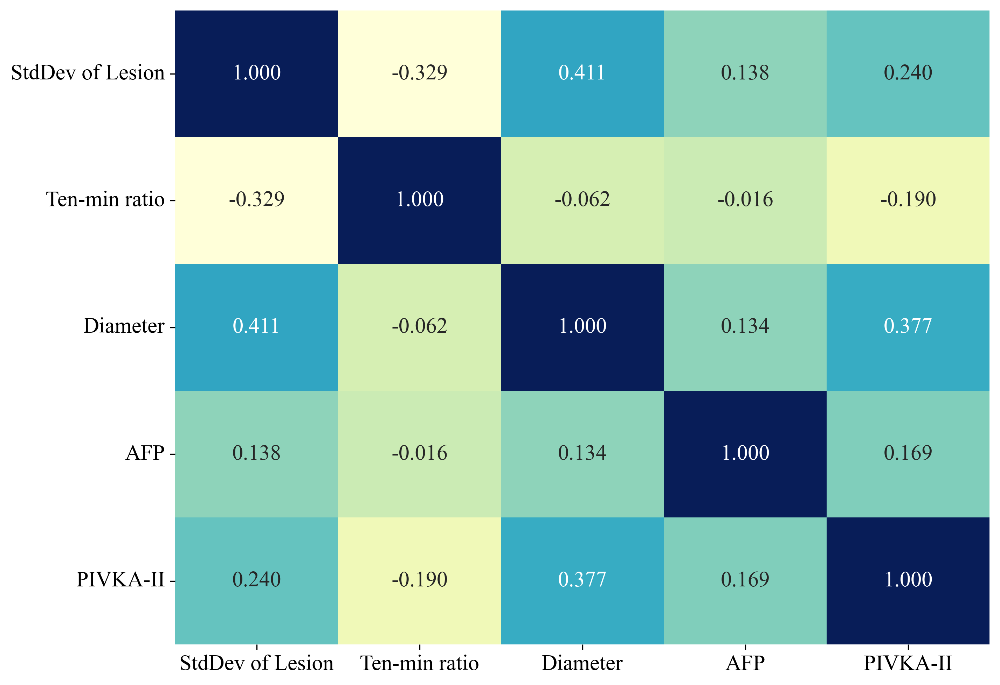

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt
from onekey_algo.custom.components.comp1 import draw_matrix

if combined_data.shape[1] < 100:
    plt.figure(figsize=(10.0, 8.0))
    # 选择可视化的相关系数
    draw_matrix(pearson_corr, annot=True, cmap='YlGnBu', cbar=False)
    plt.savefig(f'img/feature_corr.svg', bbox_inches = 'tight')

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

if combined_data.shape[1] < 100:
    pp = sns.clustermap(pearson_corr, linewidths=.5, figsize=(50.0, 40.0), cmap='YlGnBu')
    plt.setp(pp.ax_heatmap.get_yticklabels(), rotation=0)
    plt.savefig(f'img/feature_cluster.svg', bbox_inches = 'tight')

# Feature Selection -- Correlation Coefficient
## <span style="font-weight: normal;">Based on the correlation coefficient, for features with high correlation, retain only one of them.</span>

In [11]:
from onekey_algo.custom.components.comp1 import select_feature
sel_feature = select_feature(pearson_corr, threshold=0.6, topn=32, verbose=False)

sel_feature = sel_feature + labels + ['group']
sel_feature

['StdDev of Lesion',
 'Ten-min ratio',
 'Diameter',
 'AFP',
 'PIVKA-II',
 'label',
 'group']

In [12]:
sel_data = data[sel_feature]
sel_data.describe()

,StdDev of Lesion,Ten-min ratio,Diameter,AFP,PIVKA-II,label
count,3.880e+02,3.880e+02,3.880e+02,3.880e+02,3.880e+02,388.000
mean,-1.145e-16,7.325e-17,-4.120e-17,7.325e-17,-5.494e-17,0.314
std,9.987e-01,9.987e-01,9.987e-01,9.987e-01,9.987e-01,0.465
min,-2.726e+00,-1.771e+00,-1.371e+00,-5.271e-01,-1.810e+00,0.000
25%,-5.894e-01,-8.655e-01,-7.267e-01,-4.569e-01,-1.737e-02,0.000
50%,-7.755e-02,-8.724e-02,-2.885e-01,-4.569e-01,5.839e-01,0.000
75%,5.676e-01,7.215e-01,4.858e-01,-4.569e-01,5.839e-01,1.000
max,3.286e+00,2.459e+00,4.088e+00,2.181e+00,5.839e-01,1.000


# Data Splitting

In [13]:
import numpy as np
import onekey_algo.custom.components as okcomp

n_classes = 2
train_data = sel_data[(sel_data['group'] == 'train')]
train_ids = ids[train_data.index]
train_data = train_data.reset_index()
train_data = train_data.drop('index', axis=1)
y_data = train_data[labels]
X_data = train_data.drop(labels + ['group'], axis=1)

test_data = sel_data[sel_data['group'] != 'train']
test_ids = ids[test_data.index]
test_data = test_data.reset_index()
test_data = test_data.drop('index', axis=1)
y_test_data = test_data[labels]
X_test_data = test_data.drop(labels + ['group'], axis=1)

y_all_data = sel_data[labels]
X_all_data = sel_data.drop(labels + ['group'], axis=1)

column_names = X_data.columns
print(f"Number of training datasets：{X_data.shape}, Number of test datasets：{X_test_data.shape}")

训练集样本数：(306, 5), 验证集样本数：(82, 5)


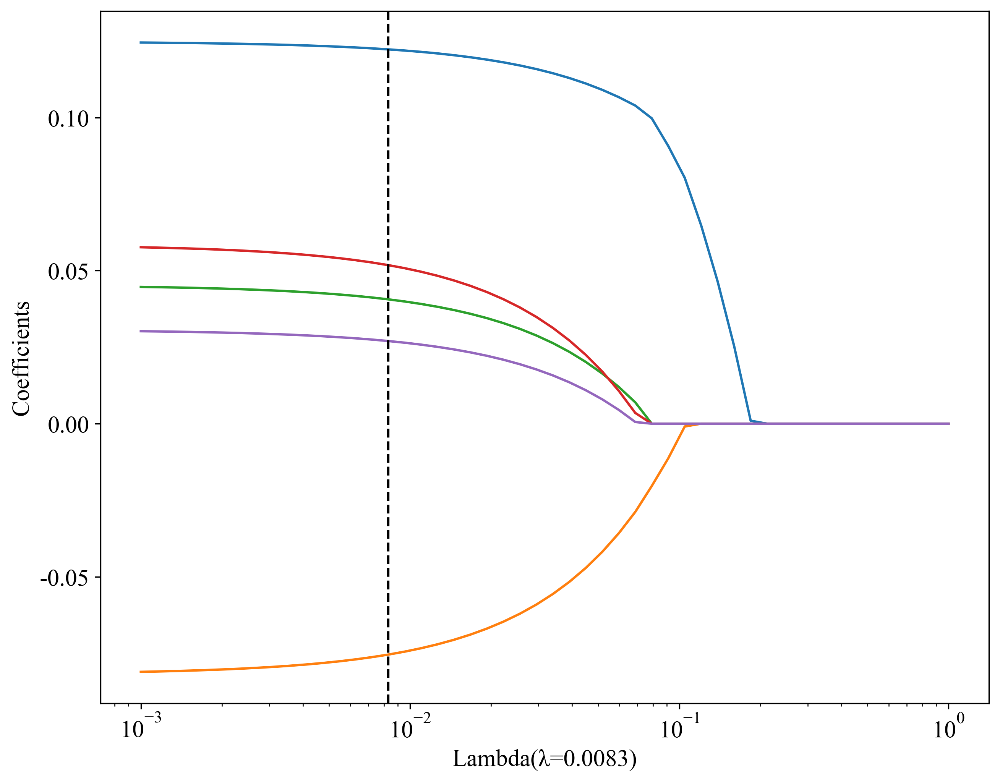

In [14]:
alpha = okcomp.comp1.lasso_cv_coefs(X_data, y_data, column_names=None, alpha_logmin=-3)
plt.savefig(f'img/feature_lasso.svg', bbox_inches = 'tight')

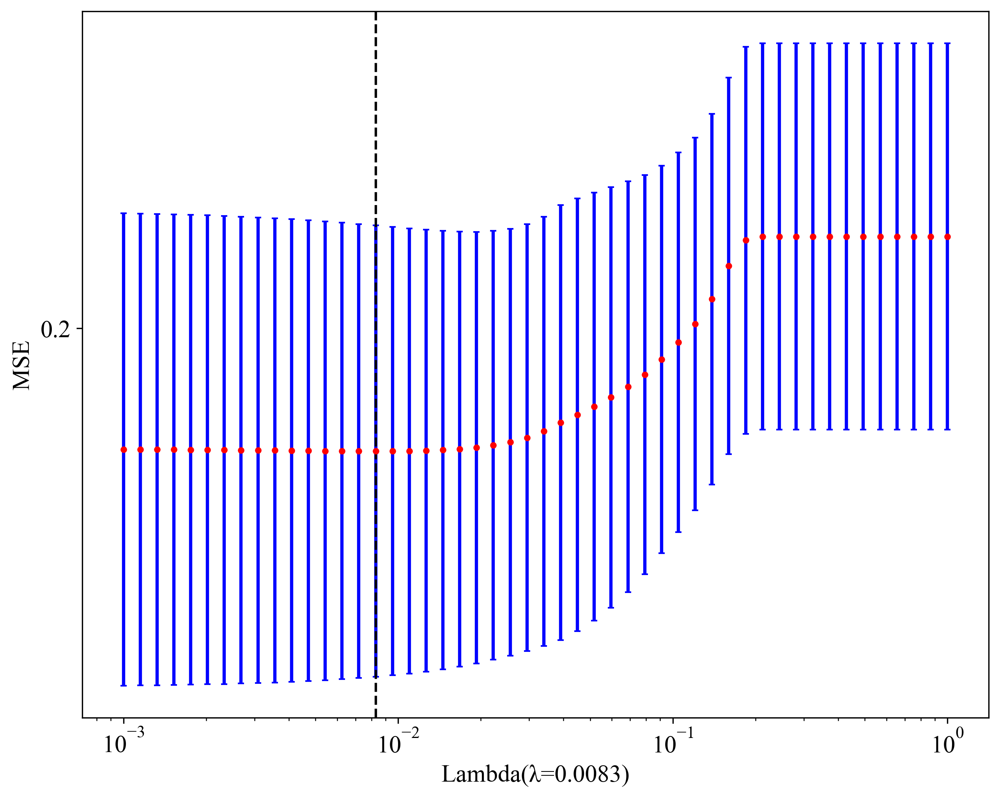

In [15]:
okcomp.comp1.lasso_cv_efficiency(X_data, y_data, points=50, alpha_logmin=-3)
plt.savefig(f'img/feature_mse_label.svg', bbox_inches = 'tight')

In [16]:
from sklearn import linear_model

models = []
for label in labels:
    clf = linear_model.Lasso(alpha=alpha)
    clf.fit(X_data, y_data[label])
    models.append(clf)

In [17]:
COEF_THRESHOLD = 1e-8 
scores = []
selected_features = []
for label, model in zip(labels, models):
    feat_coef = [(feat_name, coef) for feat_name, coef in zip(column_names, model.coef_) 
                 if COEF_THRESHOLD is None or abs(coef) > COEF_THRESHOLD]
    selected_features.append([feat for feat, _ in feat_coef])
    formula = ' '.join([f"{coef:+.6f} * {feat_name}" for feat_name, coef in feat_coef])
    score = f"{label} = {model.intercept_} {'+' if formula[0] != '-' else ''} {formula}"
    scores.append(score)
    
print(scores[0])

label = 0.31699346405228757 + +0.122304 * StdDev of Lesion -0.075447 * Ten-min ratio +0.040629 * Diameter +0.051816 * AFP +0.027016 * PIVKA-II


# Feature Coefficients

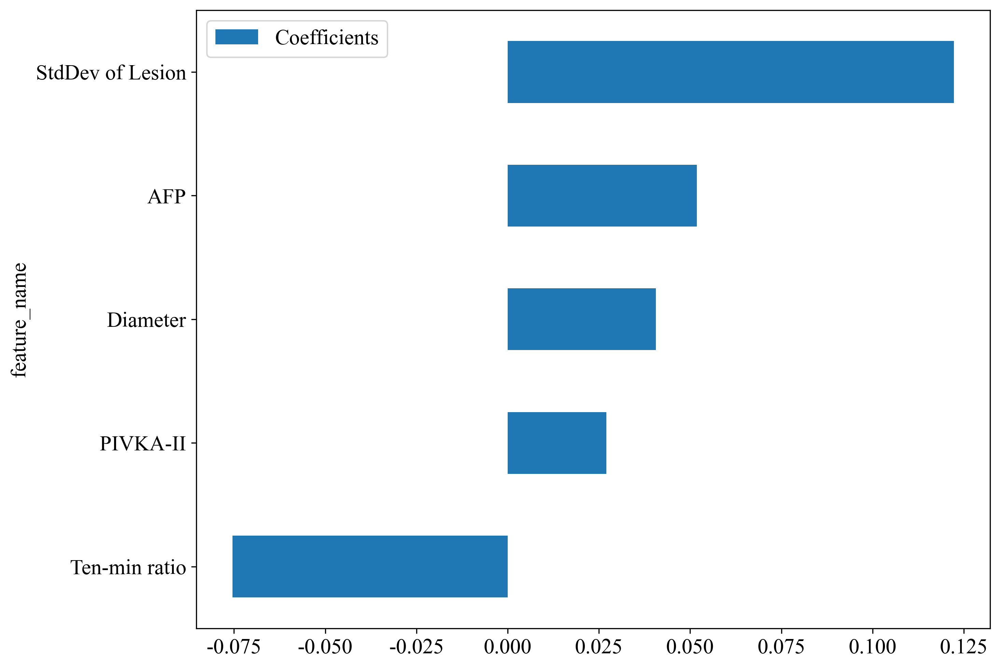

In [18]:
feat_coef = sorted(feat_coef, key=lambda x: x[1])
feat_coef_df = pd.DataFrame(feat_coef, columns=['feature_name', 'Coefficients'])
feat_coef_df.plot(x='feature_name', y='Coefficients', kind='barh')

plt.savefig(f'img/feature_weights.svg', bbox_inches = 'tight')

In [19]:
feat_coef_df.to_csv('TT5_features.csv',index=False)

In [20]:
X_data = X_data[selected_features[0]]
X_test_data = X_test_data[selected_features[0]]
X_data.columns

Index(['StdDev of Lesion', 'Ten-min ratio', 'Diameter', 'AFP', 'PIVKA-II'], dtype='object')

In [21]:
X_data.to_csv('SHAP_features.csv',index=False)# Extracted for SHapley additive exPlanations 

# Model construction and hyperparameter tuning.

In [22]:
model_names = ['SVM', 'KNN', 'RandomForest', 'XGBoost', 'LightGBM', 'NaiveBayes', 'AdaBoost', 'GradientBoosting', 'LR', 'MLP'
models = okcomp.comp1.create_clf_model(model_names)
model_names = list(models.keys())

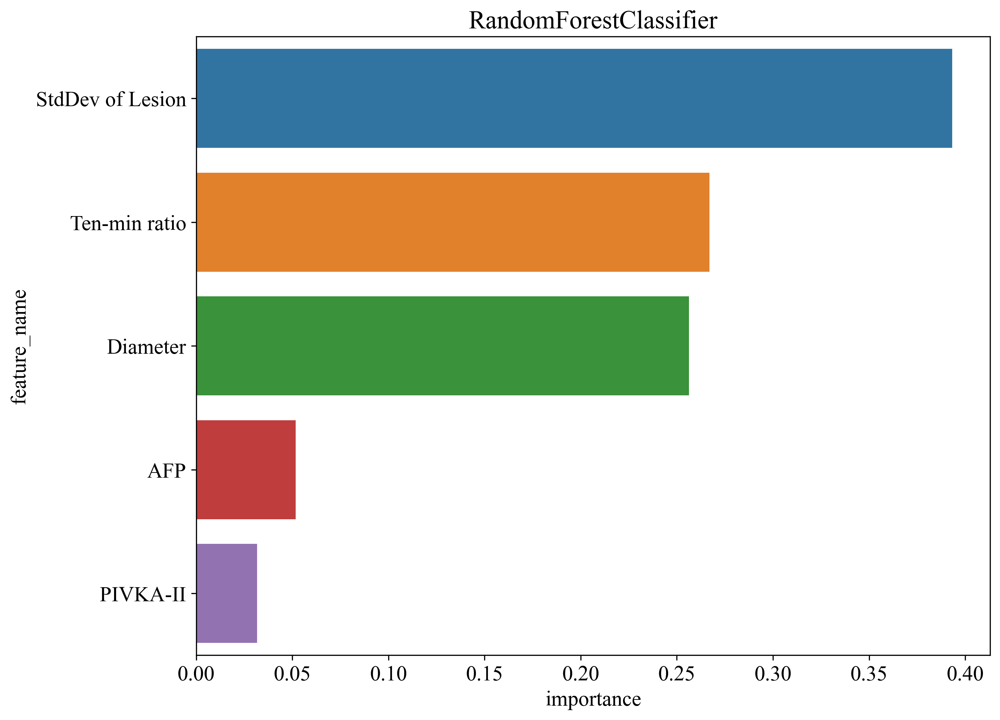

[18:26:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:576: 
Parameters: { "gama" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[18:26:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


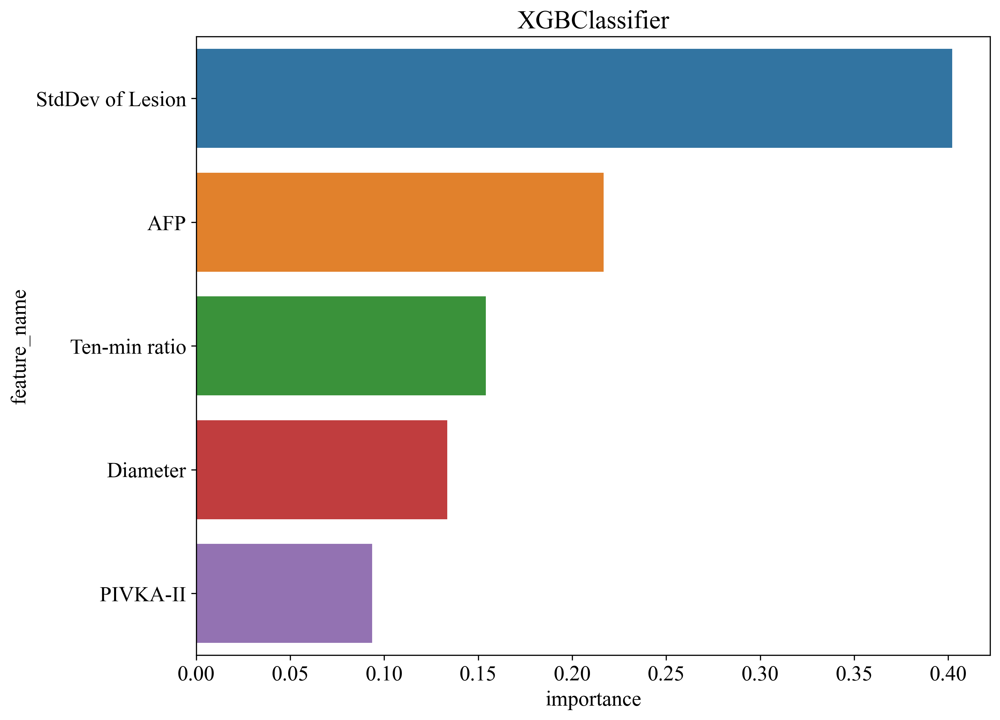

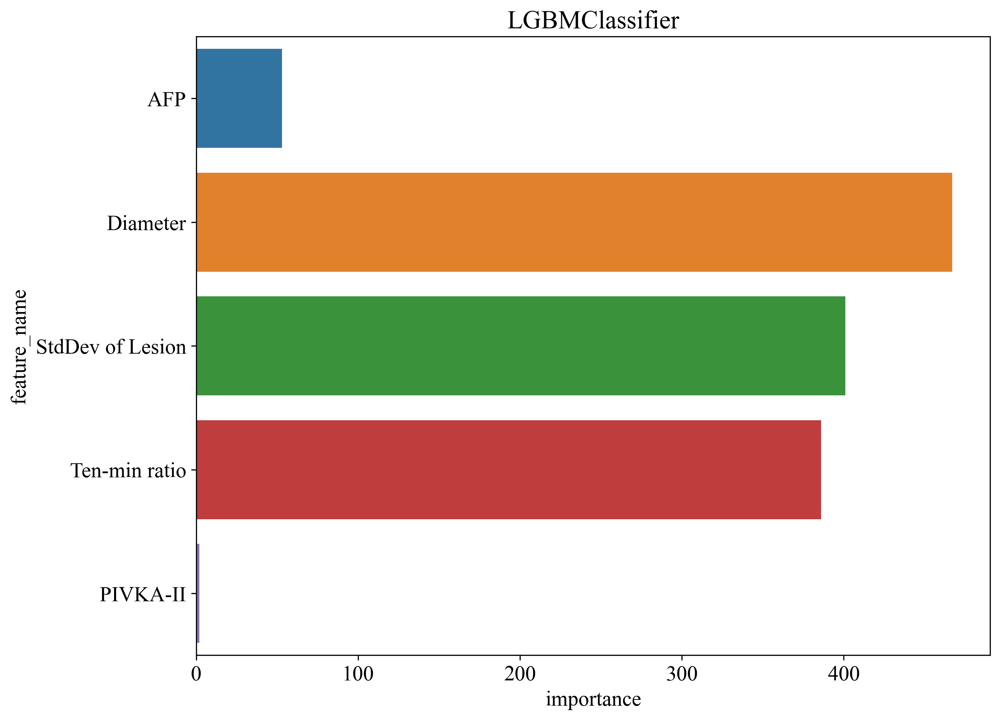

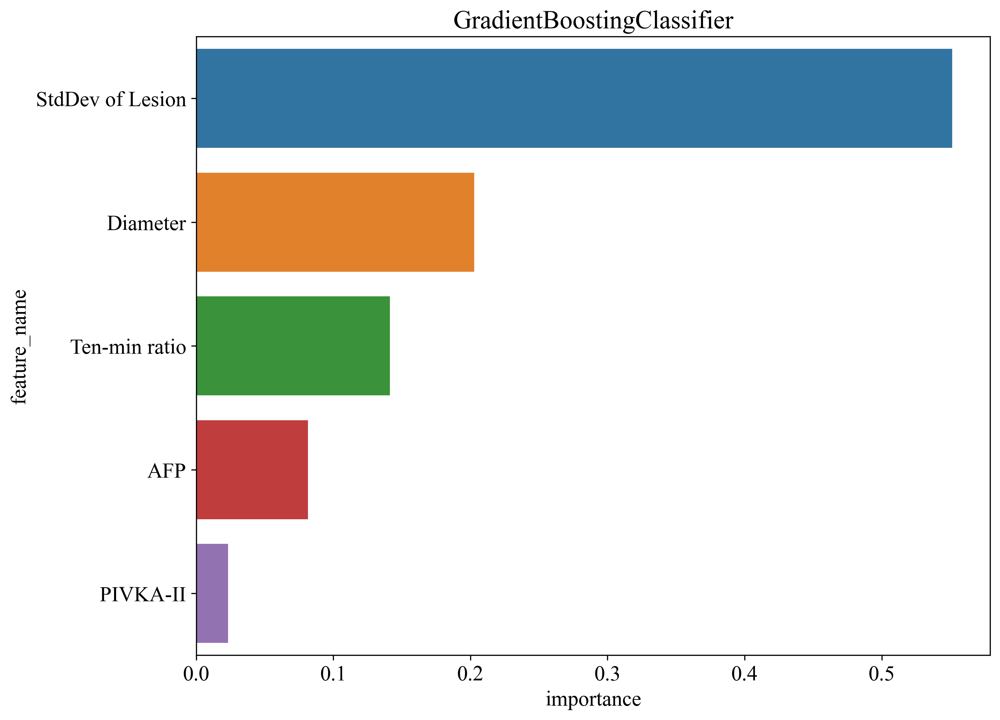

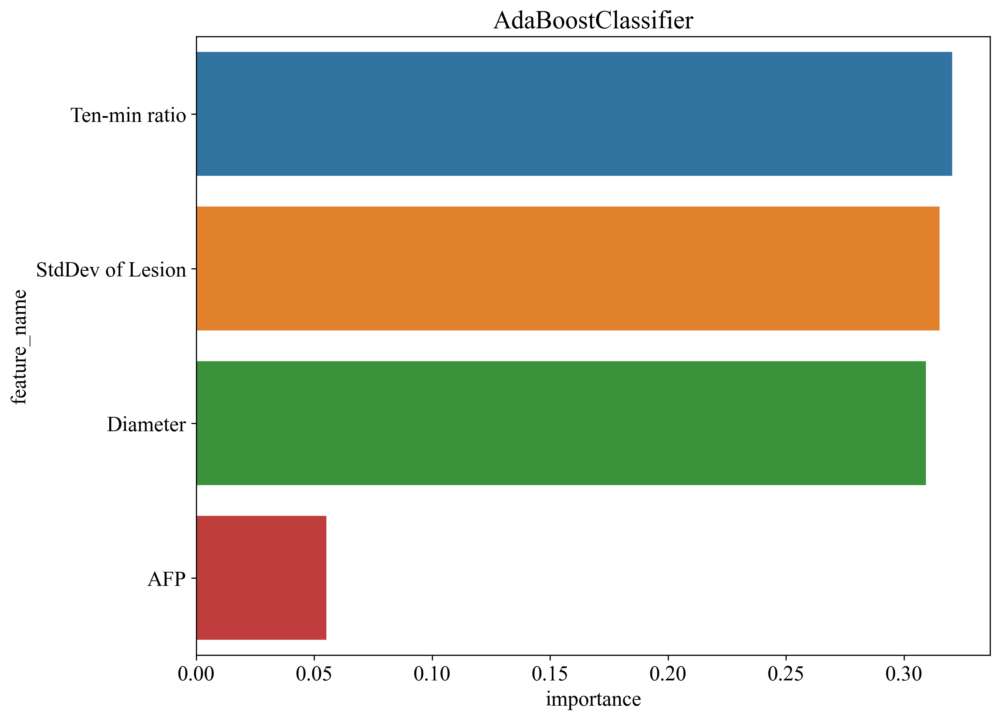

In [25]:
import joblib
from onekey_algo.custom.components.comp1 import plot_feature_importance, smote_resample
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier,AdaBoostClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from onekey_algo.custom.components.comp1 import plot_feature_importance, plot_learning_curve, smote_resample
targets = []
os.makedirs('models', exist_ok=True)
for l in labels:
    new_models = okcomp.comp1.create_clf_model_none_overfit(model_names)                                                  
    new_models['XGBoost'] = XGBClassifier(n_estimators=500, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_weight=10,reg_alpha=0.1,reg_lambda=1.0,subsample=0.9,gama=0.1)

    new_models['LightGBM'] = LGBMClassifier(n_estimators=300,colsample_bytree=0.8,max_depth=5,learning_rate=0.05,subsample=0.9,min_child_weight=10,num_leaves=31,reg_alpha=0.1,reg_lambda=2.0)
    new_models['GradientBoosting'] = GradientBoostingClassifier(learning_rate=0.01,max_depth=3,max_features='auto',min_samples_leaf=1,min_samples_split=2,n_estimators=300)
    new_models['RandomForest'] = RandomForestClassifier(bootstrap= 'True', max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=500) 
    new_models['AdaBoost'] = AdaBoostClassifier(algorithm='SAMME', base_estimator=None, learning_rate=1.0, n_estimators=50, random_state=42)
    new_models['MLP'] = MLPClassifier(activation= 'identity', alpha= 1e-05, hidden_layer_sizes= (50,), learning_rate_init= 0.0001, max_iter= 200, solver='lbfgs')
    new_models['SVM']= SVC(C= 0.1, coef0= 0, degree= 2, gamma= 'scale', kernel= 'linear', probability=True)
    new_models['KNN']= KNeighborsClassifier(metric= 'manhattan', n_neighbors= 3, p= 1, weights= 'uniform')
    new_models['NaiveBayes']= GaussianNB(priors= None)
    new_models['LR']=LogisticRegression(C= 0.1, max_iter= 100, penalty= 'l1', solver= 'liblinear')
    model_names = list(new_models.keys())
    new_models = list(new_models.values())
#import joblib
#from onekey_algo.custom.components.comp1 import plot_feature_importance, plot_learning_curve, smote_resample
#targets = []
#os.makedirs('models', exist_ok=True)
#for l in labels:
    #new_models = list(okcomp.comp1.create_clf_model(model_names).values())
    X_train_sel, X_test_sel, y_train_sel, y_test_sel = X_data, X_test_data, y_data, y_test_data
    for mn, m in zip(model_names, new_models):
        X_train_smote, y_train_smote = X_train_sel, y_train_sel
        #Synthetic Minority Over-sampling Technique
        X_train_smote, y_train_smote = smote_resample(X_train_sel, y_train_sel)
        m.fit(X_train_smote, y_train_smote[l])
        # Save the trained model
        joblib.dump(m, f'models/{mn}_{l}.pkl') 
        # Output Model Feature Importance
        plot_feature_importance(m, selected_features[0], save_dir='img')
        
#         plot_learning_curve(m, X_train_sel, y_train_sel, title=f'Learning Curve {mn}')
#         plt.savefig(f"img/Rad_{mn}_learning_curve.svg", bbox_inches='tight')
        ##plt.show()
    targets.append(new_models)

# Models evaluation and comparison

In [26]:

from sklearn.metrics import accuracy_score
from sklearn.preprocessing import OneHotEncoder
from onekey_algo.custom.components.delong import calc_95_CI
from onekey_algo.custom.components.metrics import analysis_pred_binary

predictions = [[(model.predict(X_train_sel), model.predict(X_test_sel)) 
                for model in target] for label, target in zip(labels, targets)]
pred_scores = [[(model.predict_proba(X_train_sel), model.predict_proba(X_test_sel)) 
                for model in target] for label, target in zip(labels, targets)]

metric = []
pred_sel_idx = []
for label, prediction, scores in zip(labels, predictions, pred_scores):
    pred_sel_idx_label = []
    for mname, (train_pred, test_pred), (train_score, test_score) in zip(model_names, prediction, scores):
        # Calculate the metrics for the training cohort
        acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres = analysis_pred_binary(y_train_sel[label], 
                                                                                              train_score[:, 1])
        ci = f"{ci[0]:.4f} - {ci[1]:.4f}"
        metric.append((mname, acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres, f"{label}-train"))
                 
        # Calculate the metrics for the validation cohort
        acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres = analysis_pred_binary(y_test_sel[label], 
                                                                                              test_score[:, 1])
        ci = f"{ci[0]:.4f} - {ci[1]:.4f}"
        metric.append((mname, acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres, f"{label}-test"))
        # Calculate the sel idx corresponding to the thres 
        pred_sel_idx_label.append(np.logical_or(test_score[:, 0] >= thres, test_score[:, 1] >= thres))
    
    pred_sel_idx.append(pred_sel_idx_label)
metric = pd.DataFrame(metric, index=None, columns=['model_name', 'Accuracy', 'AUC', '95% CI',
                                                   'Sensitivity', 'Specificity', 
                                                   'PPV', 'NPV', 'Precision', 'Recall', 'F1',
                                                   'Threshold', 'Task'])
metric

,model_name,Accuracy,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Threshold,Task
0,LR,0.768,0.791,0.7318 - 0.8492,0.701,0.799,0.618,0.852,0.618,0.701,0.657,0.564,label-train
1,LR,0.793,0.854,0.7700 - 0.9381,0.680,0.842,0.654,0.857,0.654,0.680,0.667,0.579,label-test
2,NaiveBayes,0.742,0.785,0.7284 - 0.8417,0.742,0.742,0.571,0.861,0.571,0.742,0.646,0.528,label-train
3,NaiveBayes,0.683,0.792,0.6831 - 0.9000,0.800,0.632,0.488,0.878,0.488,0.800,0.606,0.346,label-test
4,SVM,0.771,0.852,0.8061 - 0.8970,0.794,0.761,0.606,0.888,0.606,0.794,0.687,0.439,label-train
5,SVM,0.756,0.790,0.6711 - 0.9092,0.760,0.754,0.576,0.878,0.576,0.760,0.655,0.500,label-test
6,KNN,0.889,0.948,0.9263 - 0.9695,0.649,1.000,1.000,0.860,1.000,0.649,0.787,0.667,label-train
7,KNN,0.732,0.747,0.6357 - 0.8583,0.360,0.895,0.600,0.761,0.600,0.360,0.450,0.667,label-test
8,RandomForest,0.997,1.000,1.0000 - 1.0000,0.990,1.000,1.000,0.995,1.000,0.990,0.995,0.544,label-train
9,RandomForest,0.732,0.815,0.7230 - 0.9065,0.720,0.737,0.545,0.857,0.545,0.720,0.621,0.444,label-test


# Plot the Curves

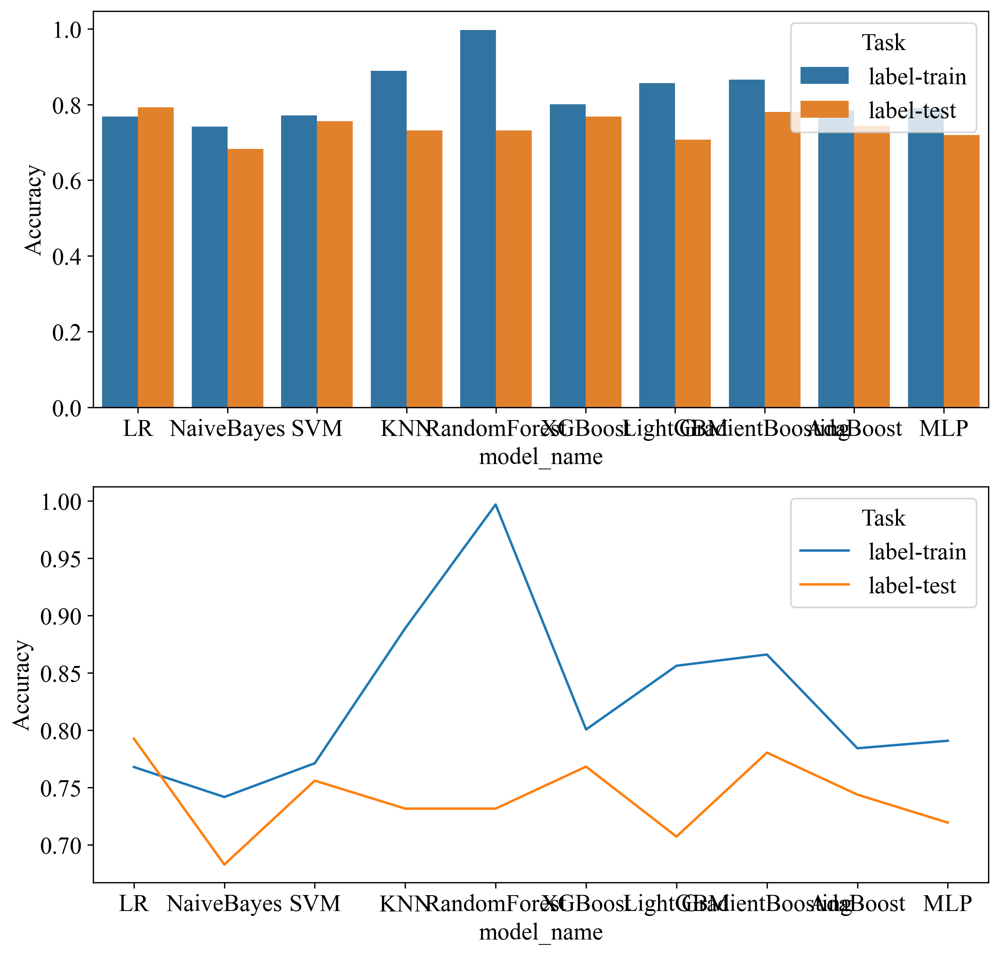

In [27]:
import seaborn as sns
plt.figure(figsize=(10, 10))
plt.subplot(211)
sns.barplot(x='model_name', y='Accuracy', data=metric, hue='Task')
plt.subplot(212)
sns.lineplot(x='model_name', y='Accuracy', data=metric, hue='Task')
plt.savefig(f'img/model_acc.svg', bbox_inches = 'tight')

In [28]:
sel_model = ['SVM', 'KNN']

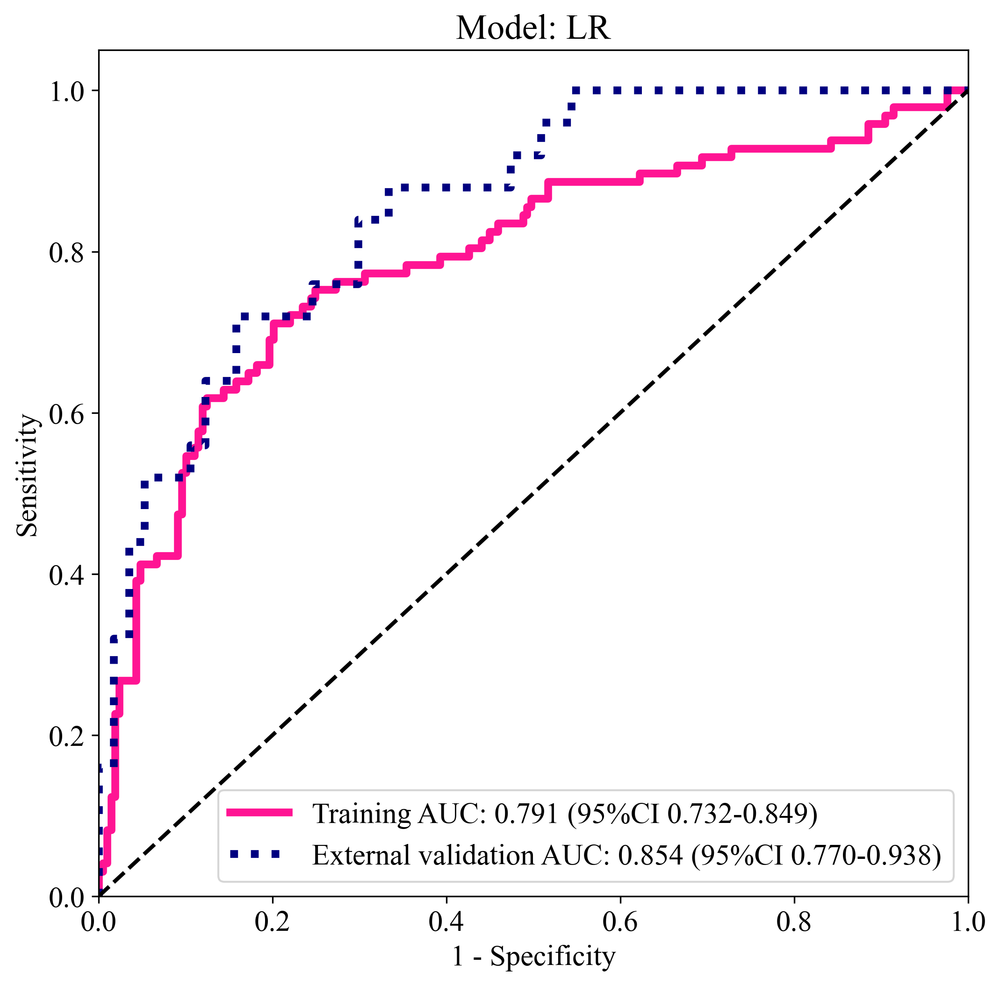

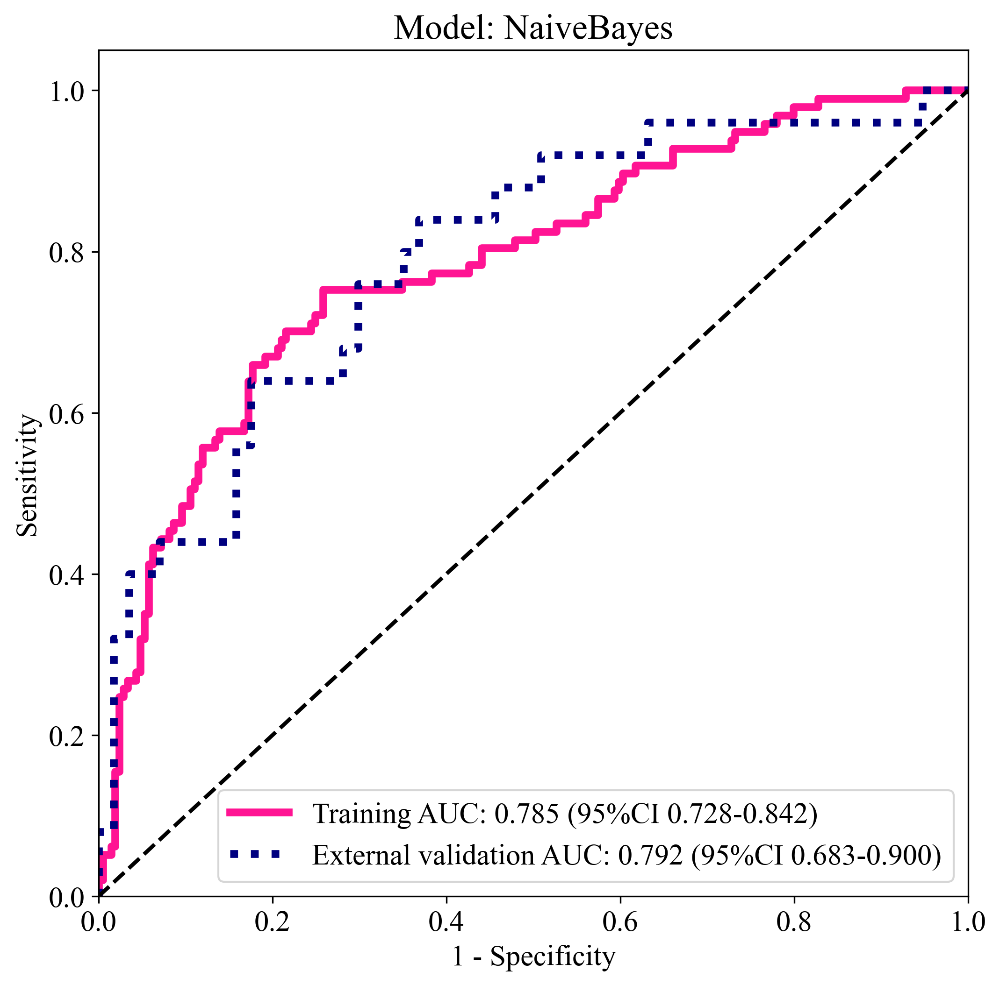

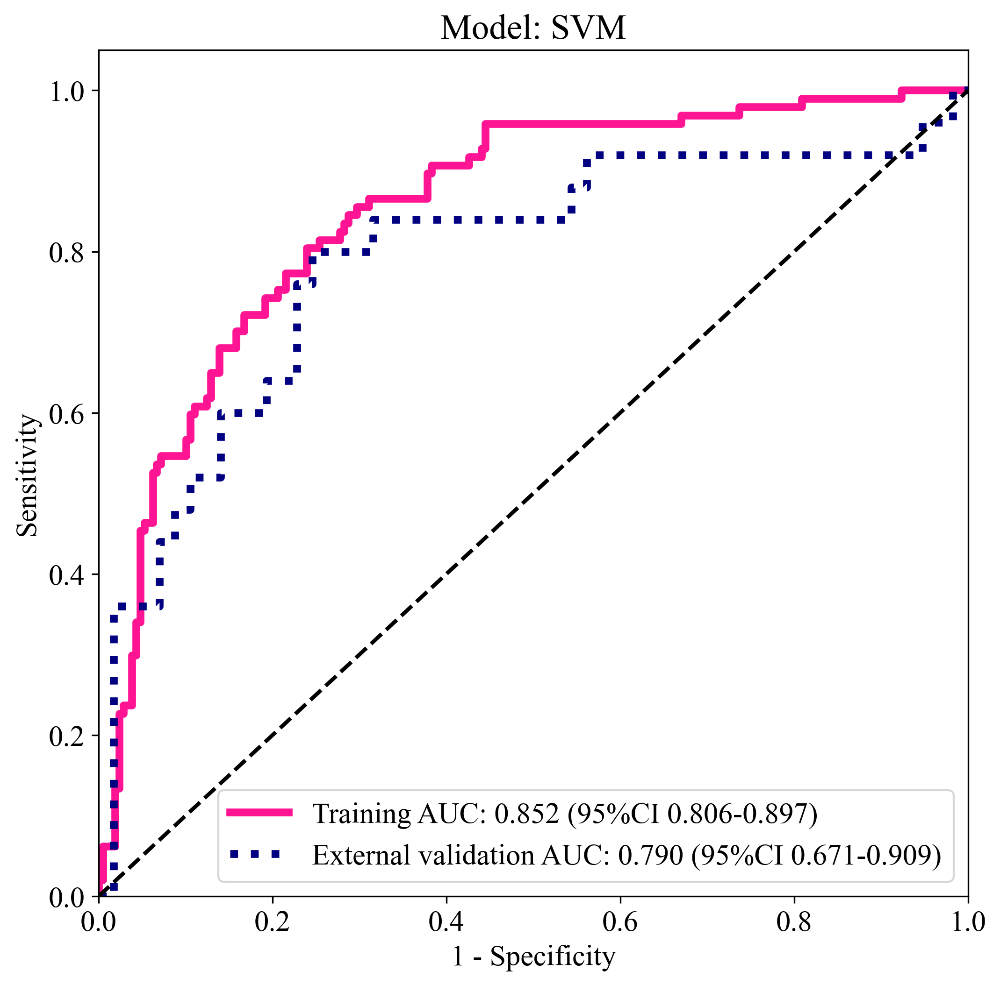

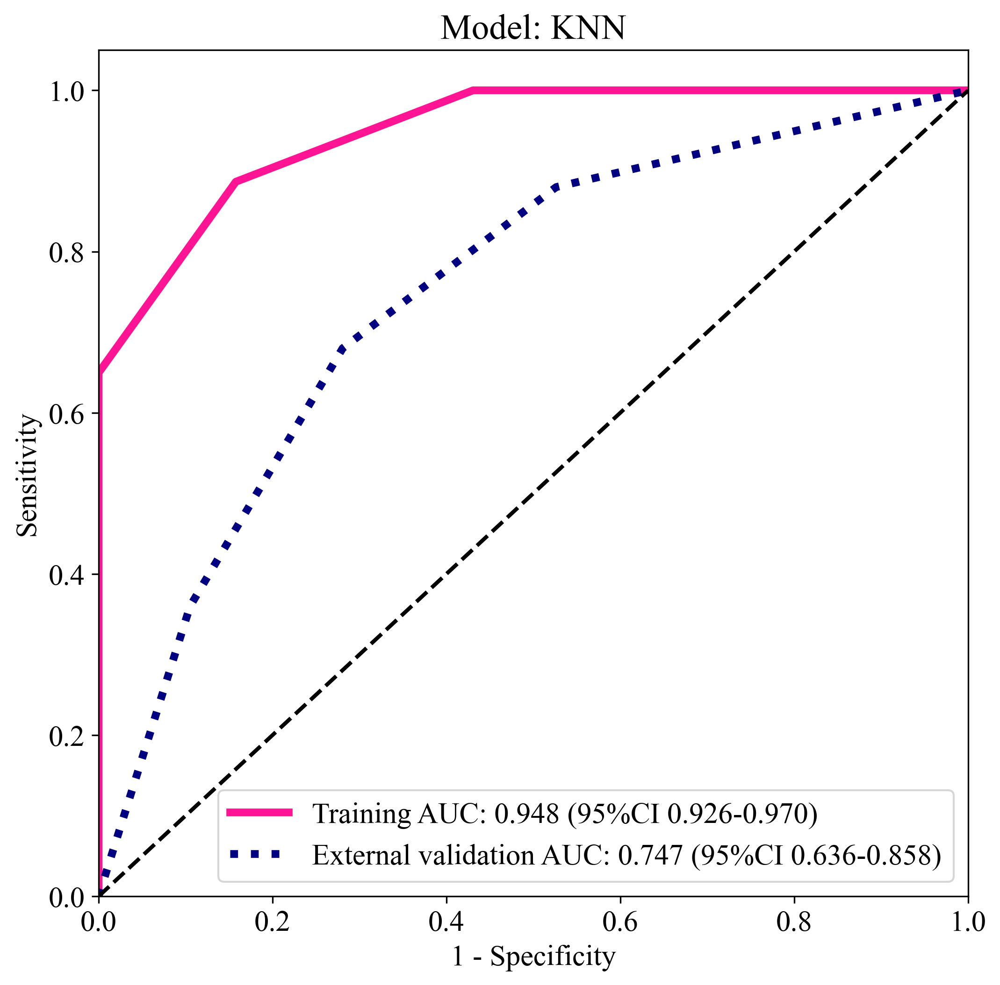

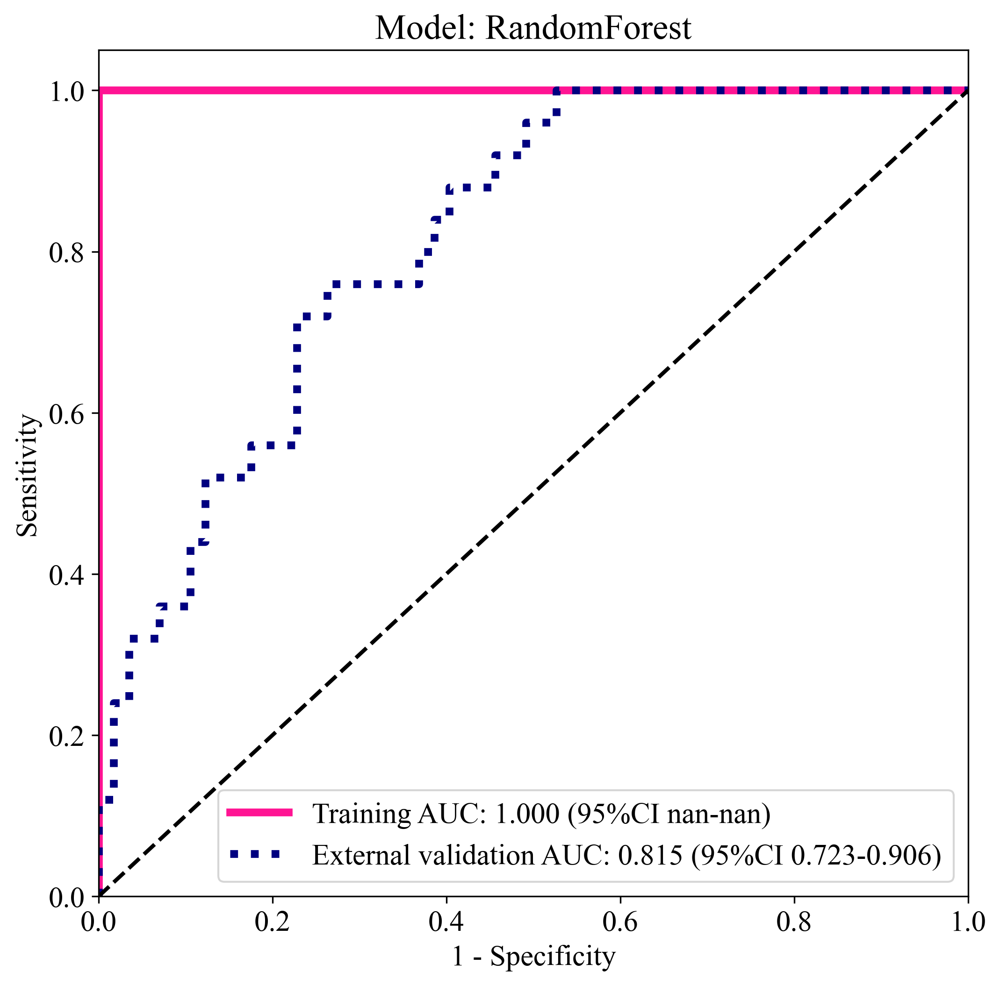

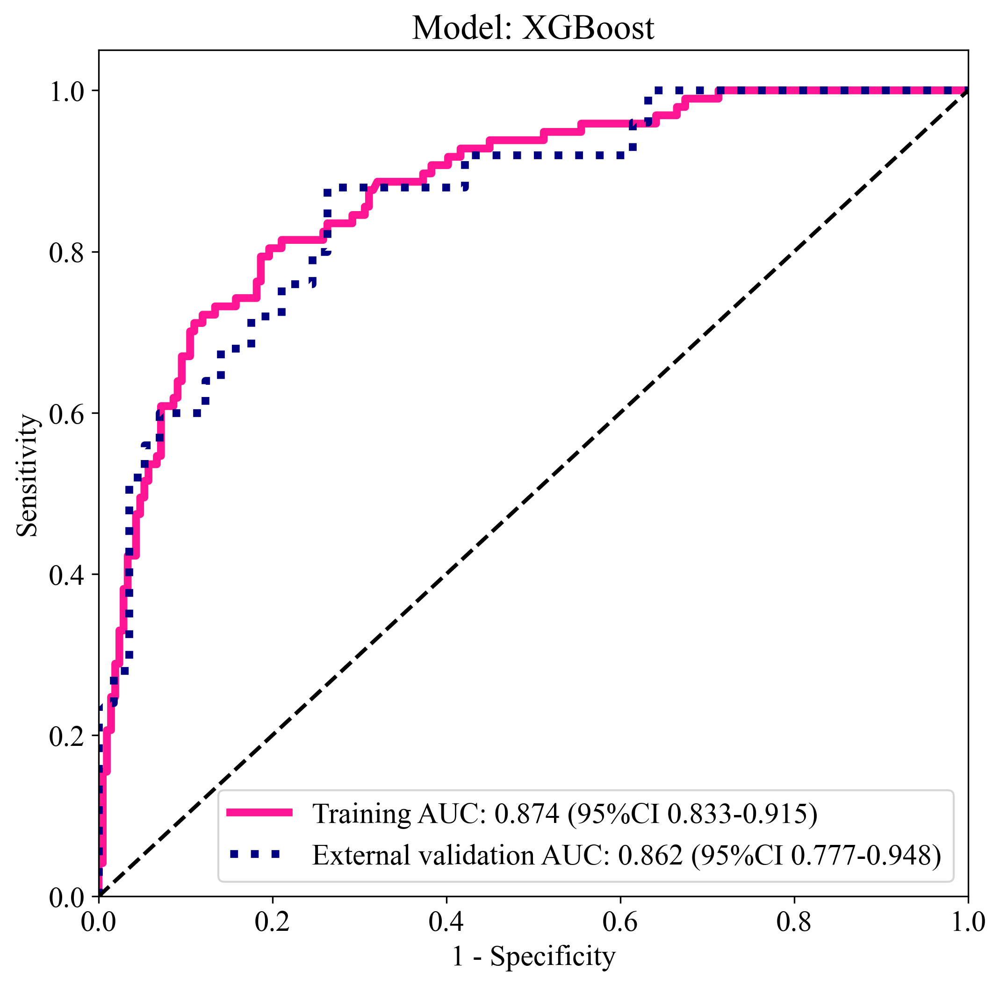

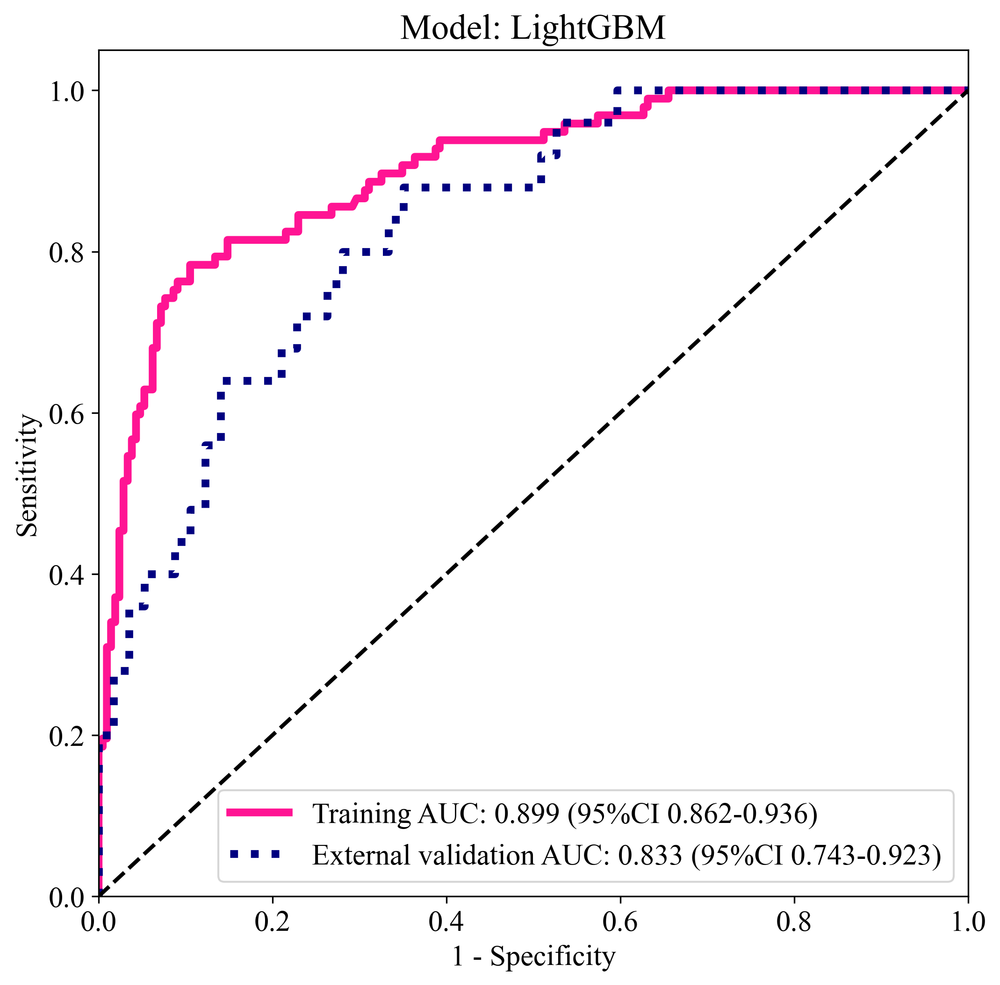

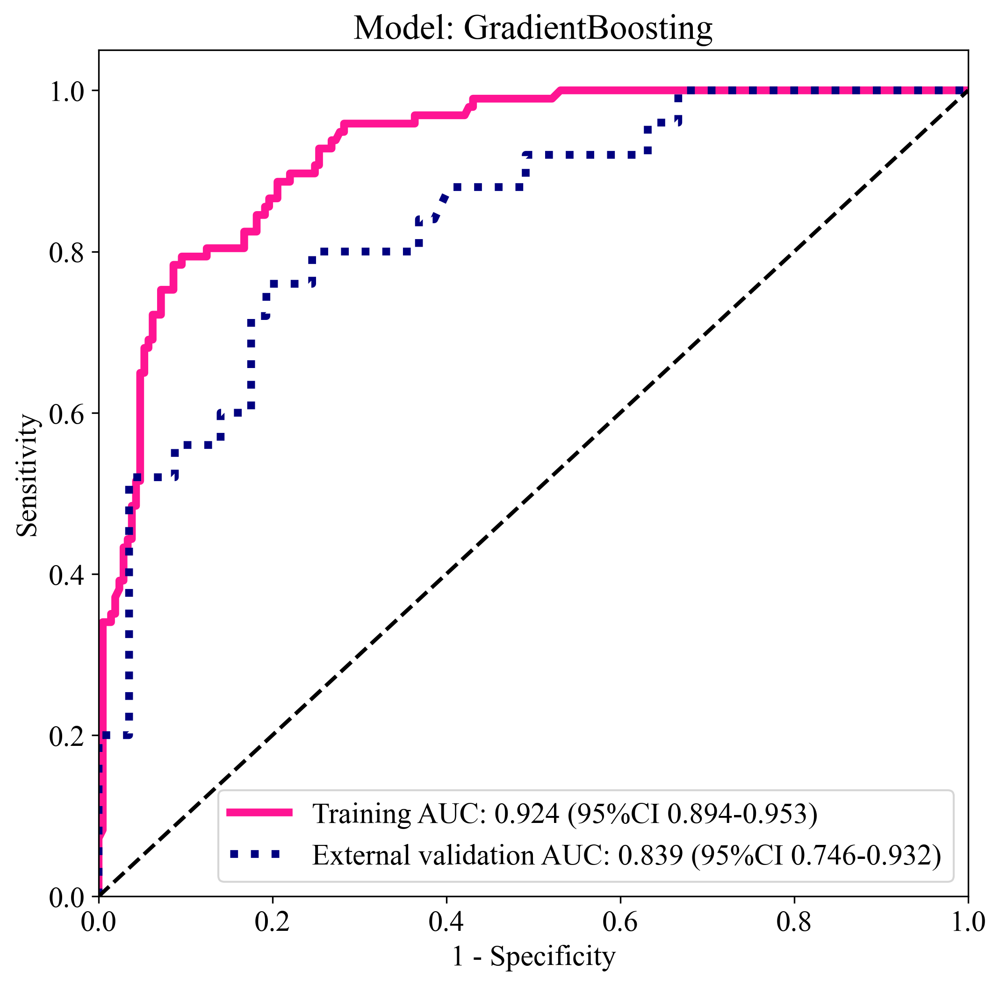

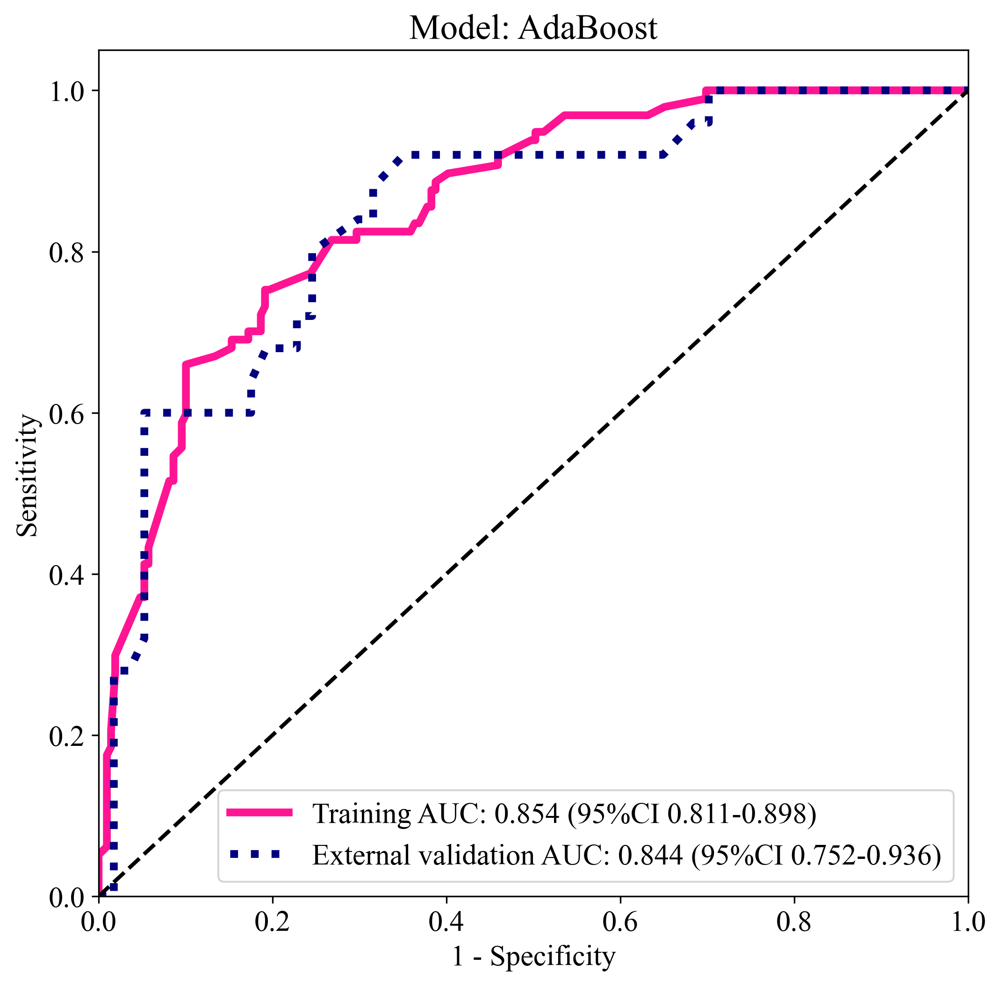

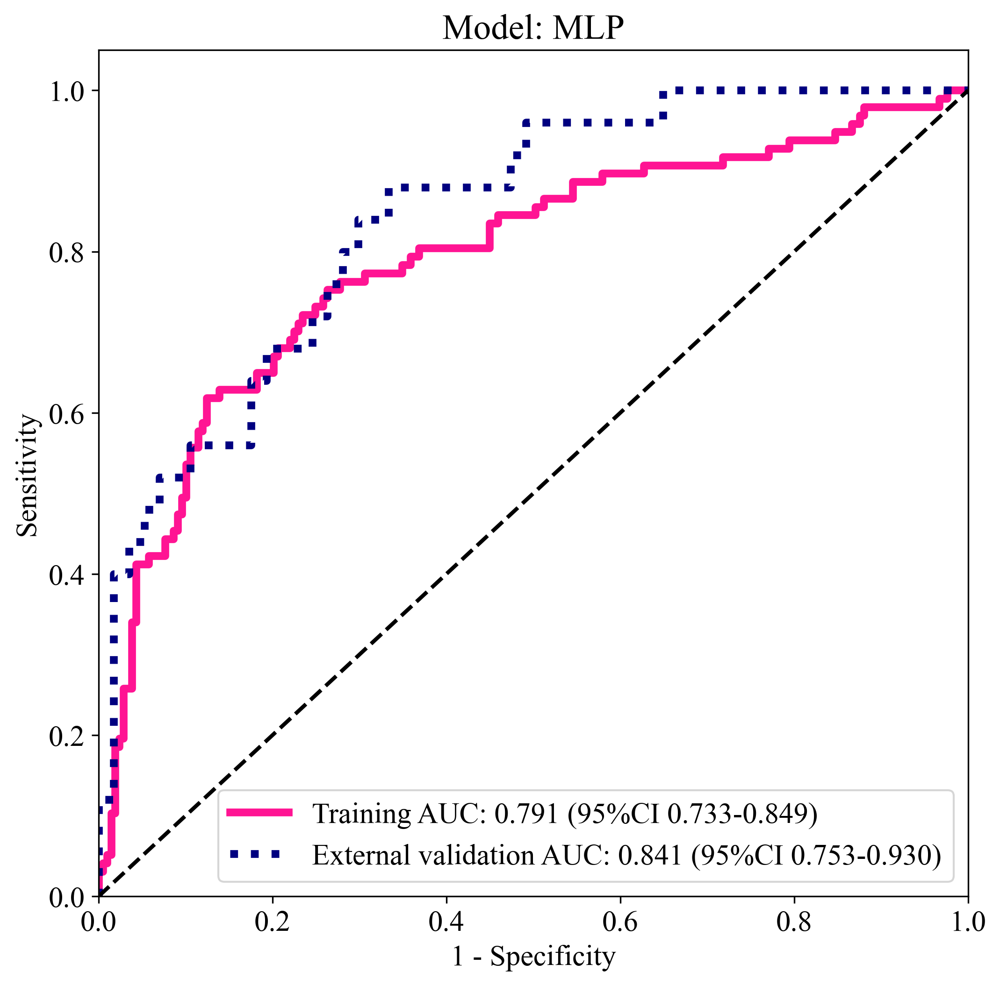

In [29]:
sel_model = model_names

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
    
        # Plot all ROC curves
        plt.figure(figsize=(8, 8))
        for pred_score, label in zip(pred_scores, labels):
            okcomp.comp1.draw_roc([np.array(y_train_sel[label]), np.array(y_test_sel[label])], 
                                  pred_score[sel_model_idx], 
                                  labels=['Name according to the cohorts'], title=f"Model: {sm}")
            plt.savefig(f'img/model_{sm}_roc.svg', bbox_inches = 'tight')

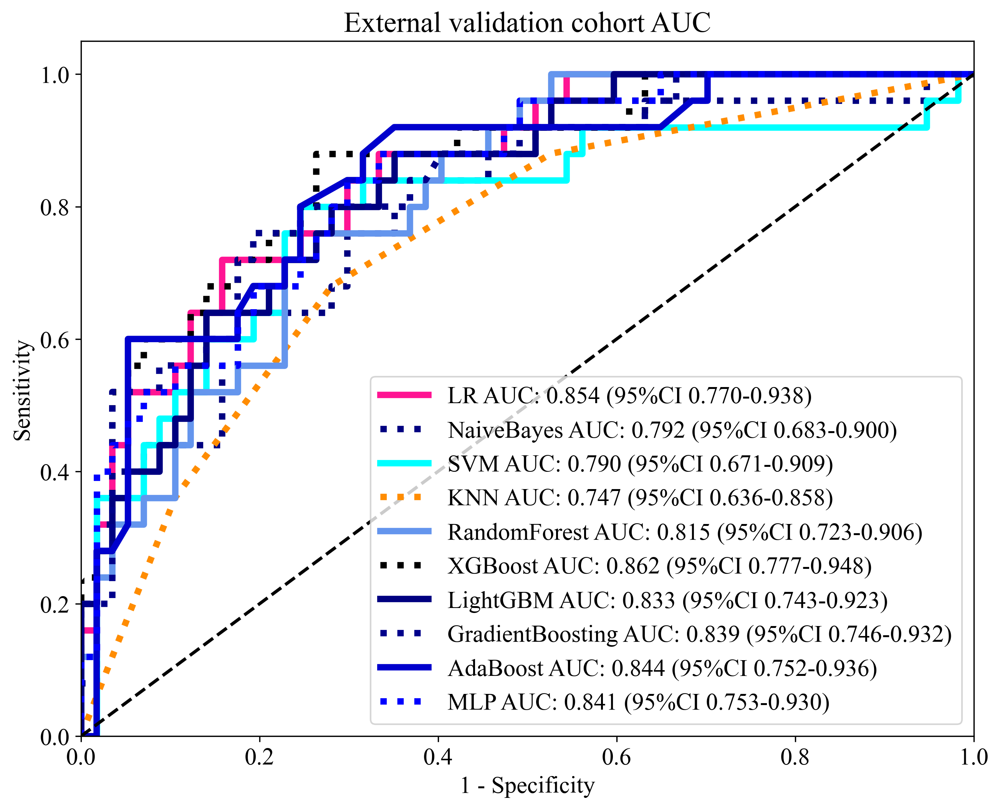

In [30]:
sel_model = model_names

for pred_score, label in zip(pred_scores, labels):
    pred_test_scores = []
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            pred_test_scores.append(pred_score[sel_model_idx][1])
    okcomp.comp1.draw_roc([np.array(y_test_sel[label])] * len(pred_test_scores), 
                          pred_test_scores, 
                          labels=sel_model, title=f"Name according to the cohort")
    plt.savefig(f'img/model_roc.svg', bbox_inches = 'tight')
    
sel_model = model_names



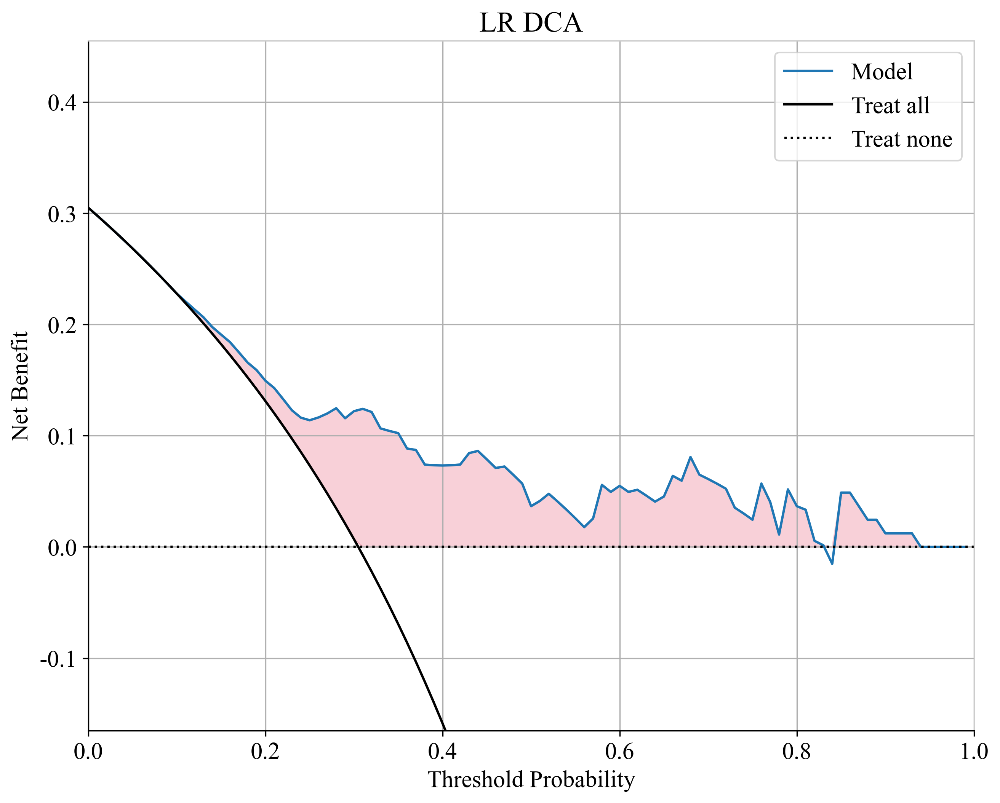

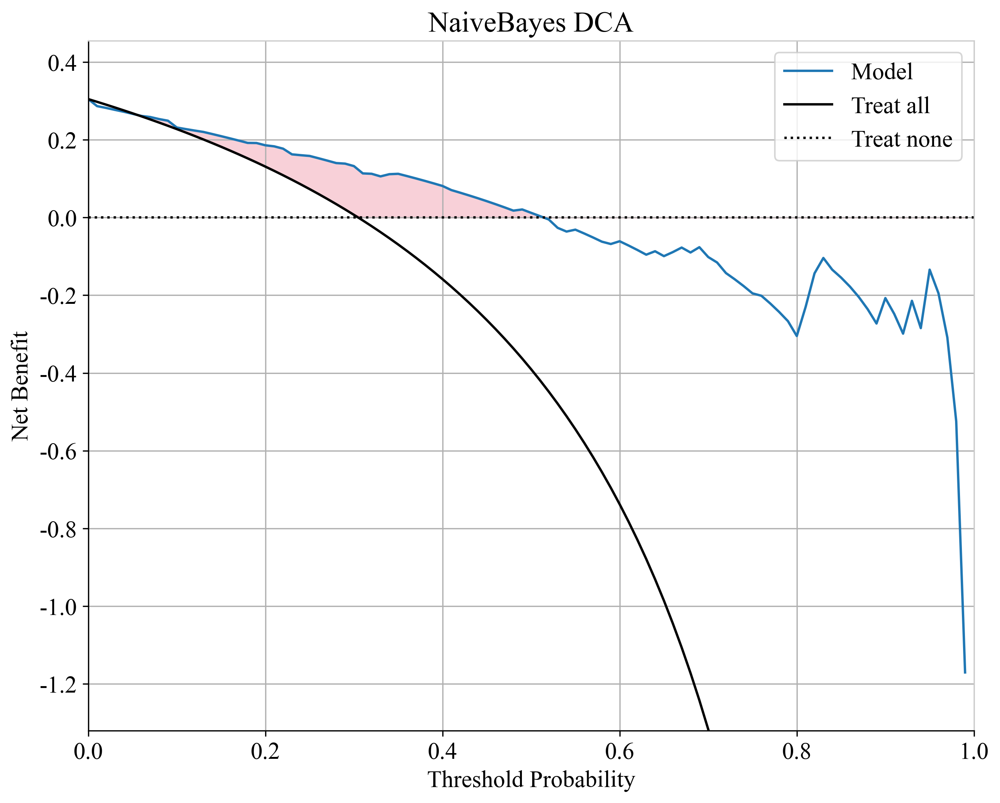

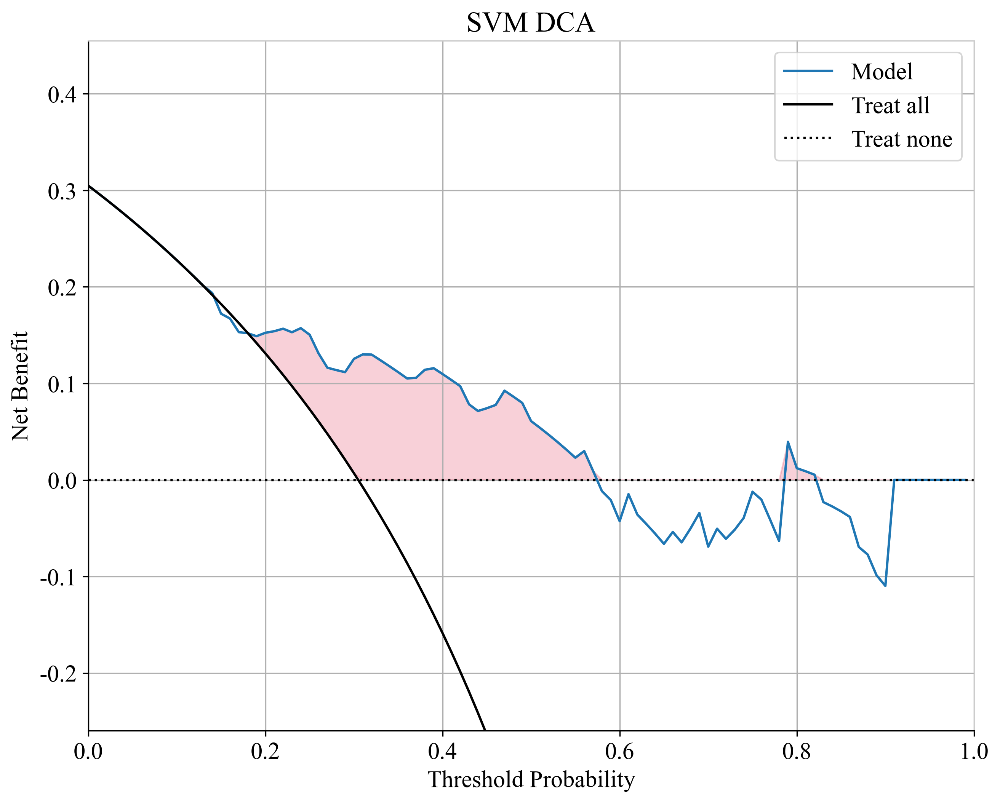

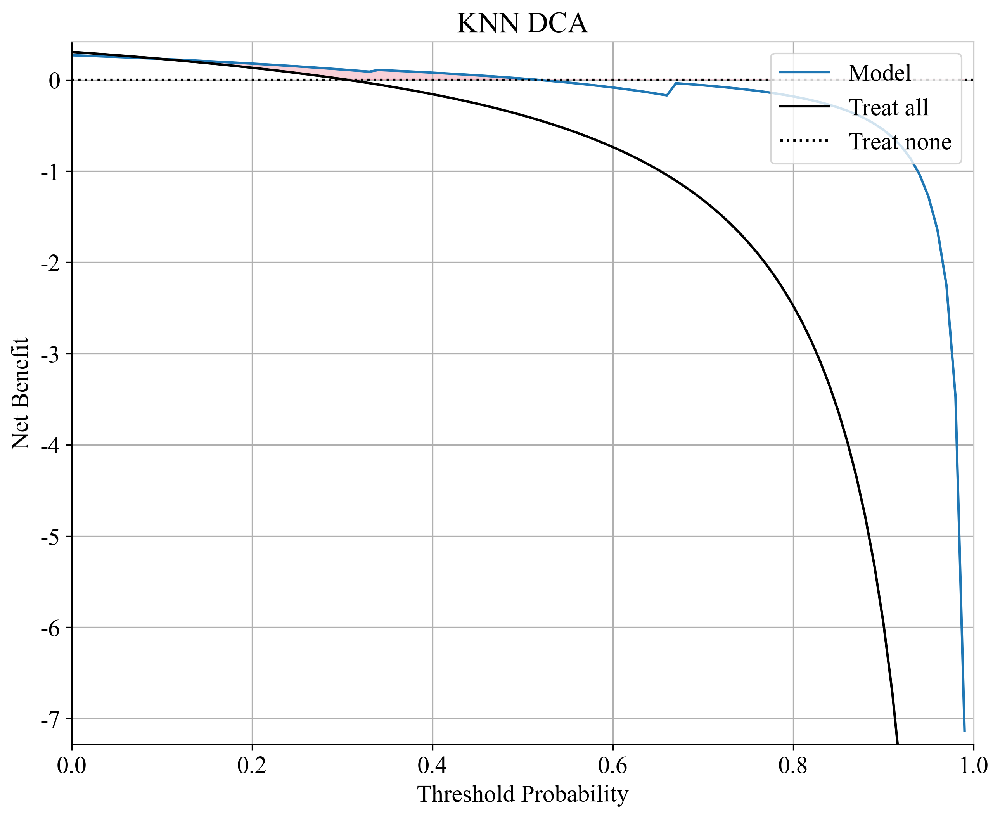

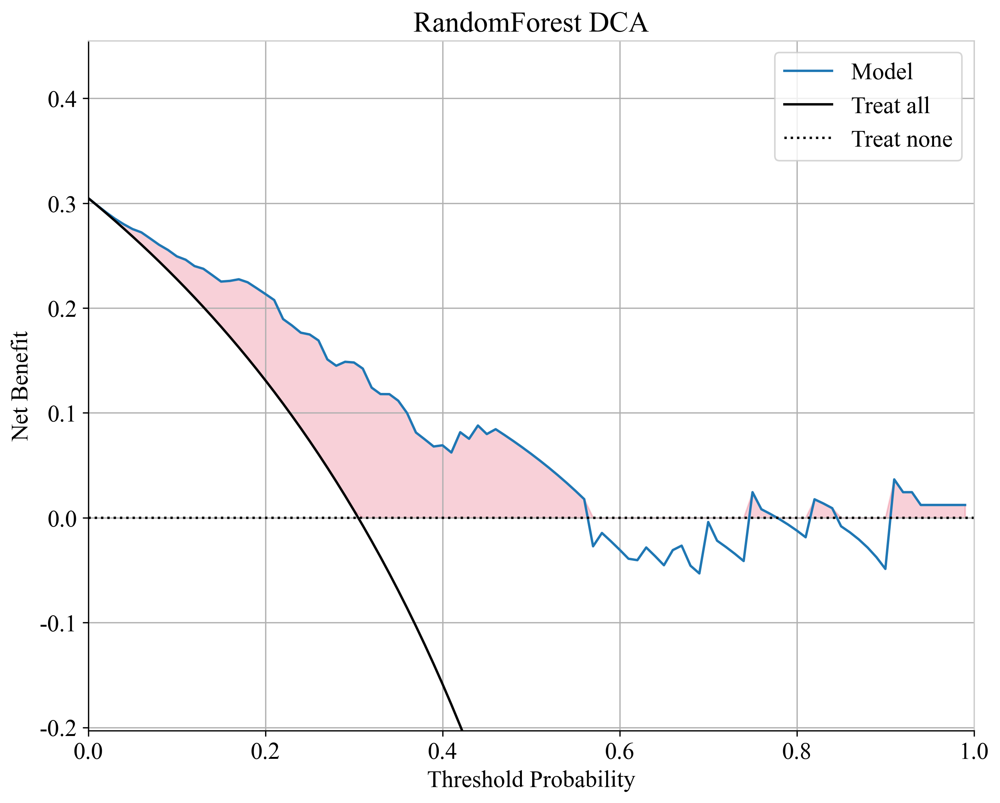

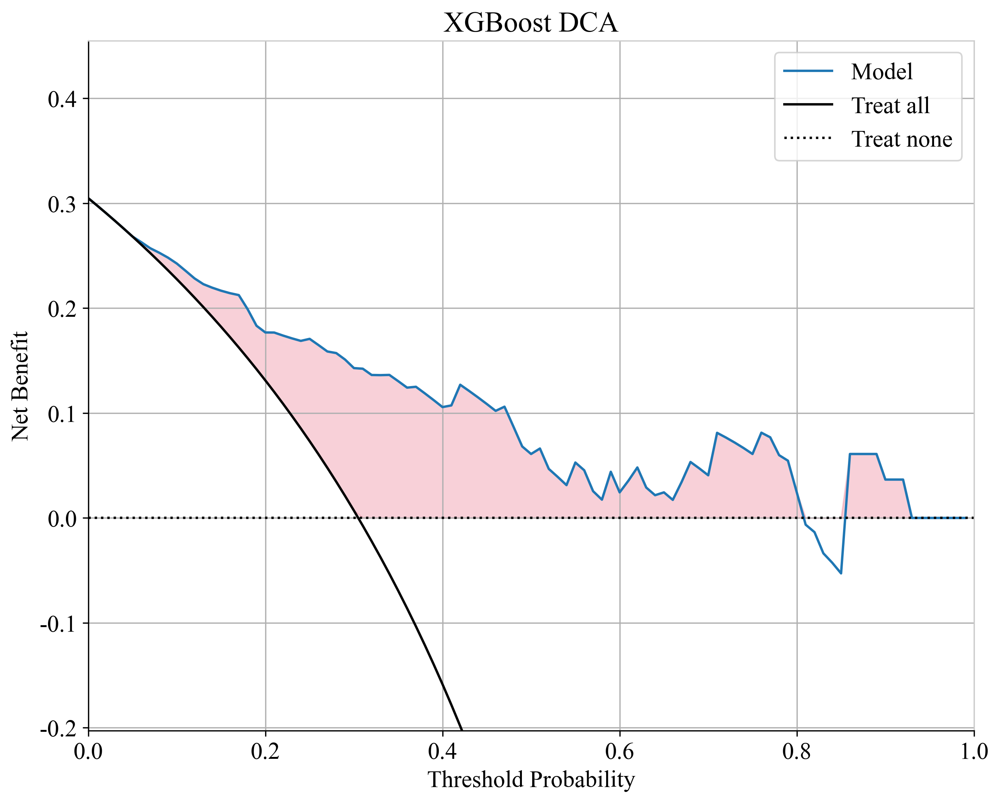

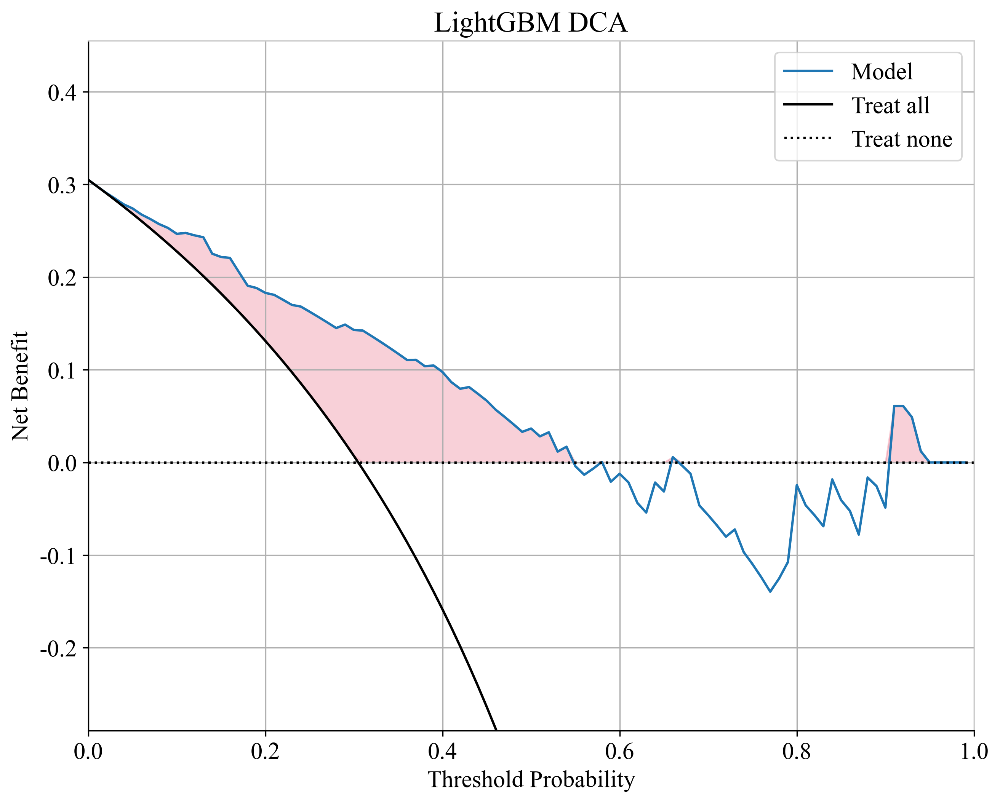

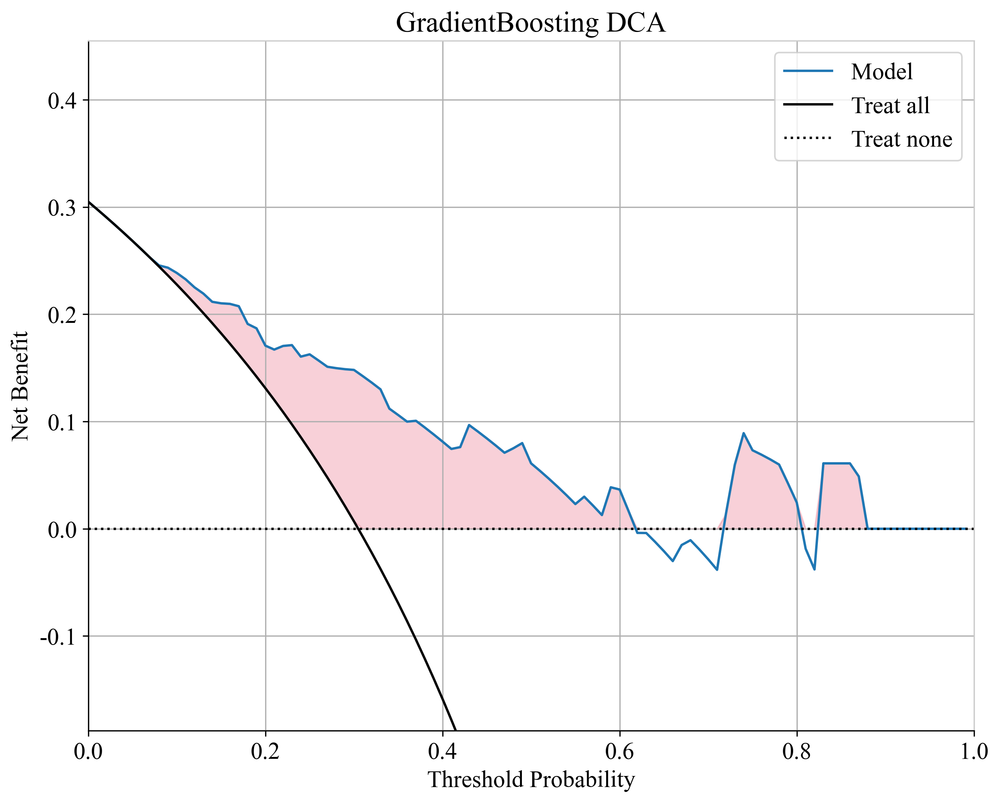

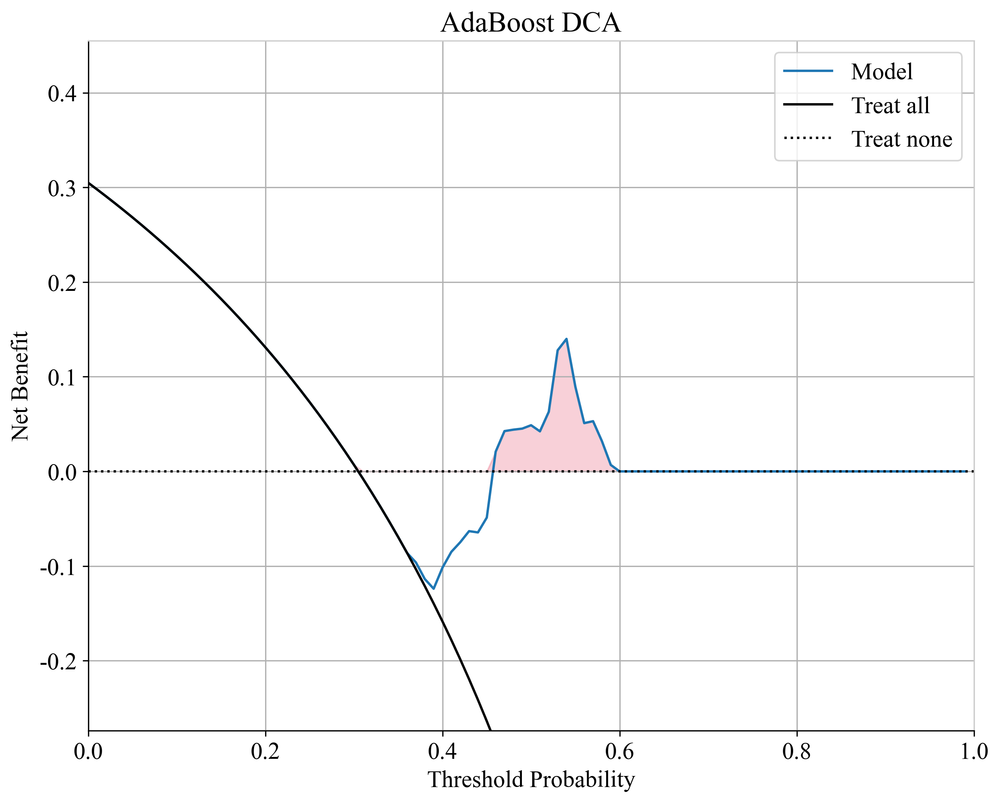

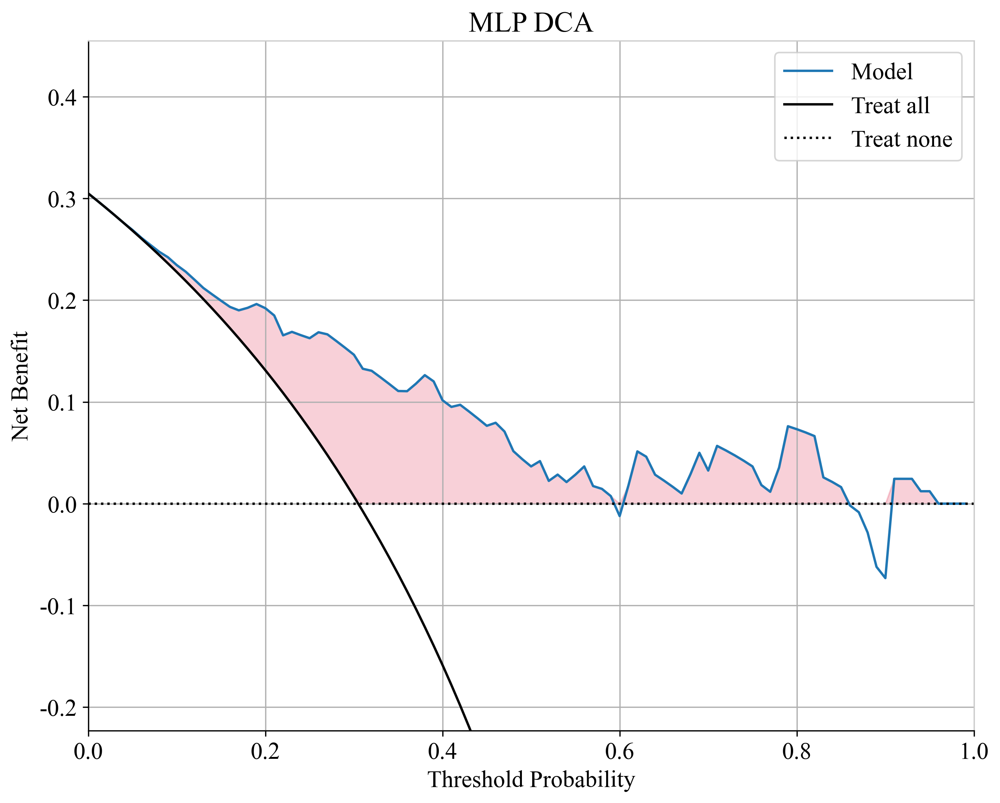

In [31]:
from onekey_algo.custom.components.comp1 import plot_DCA

for pred_score, label in zip(pred_scores, labels):
    pred_test_scores = []
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            okcomp.comp1.plot_DCA(pred_score[sel_model_idx][1][:,1], np.array(y_test_sel[label]),
                                  title=f'{sm} DCA')
            plt.savefig(f'img/model_{sm}_dca.svg', bbox_inches = 'tight')

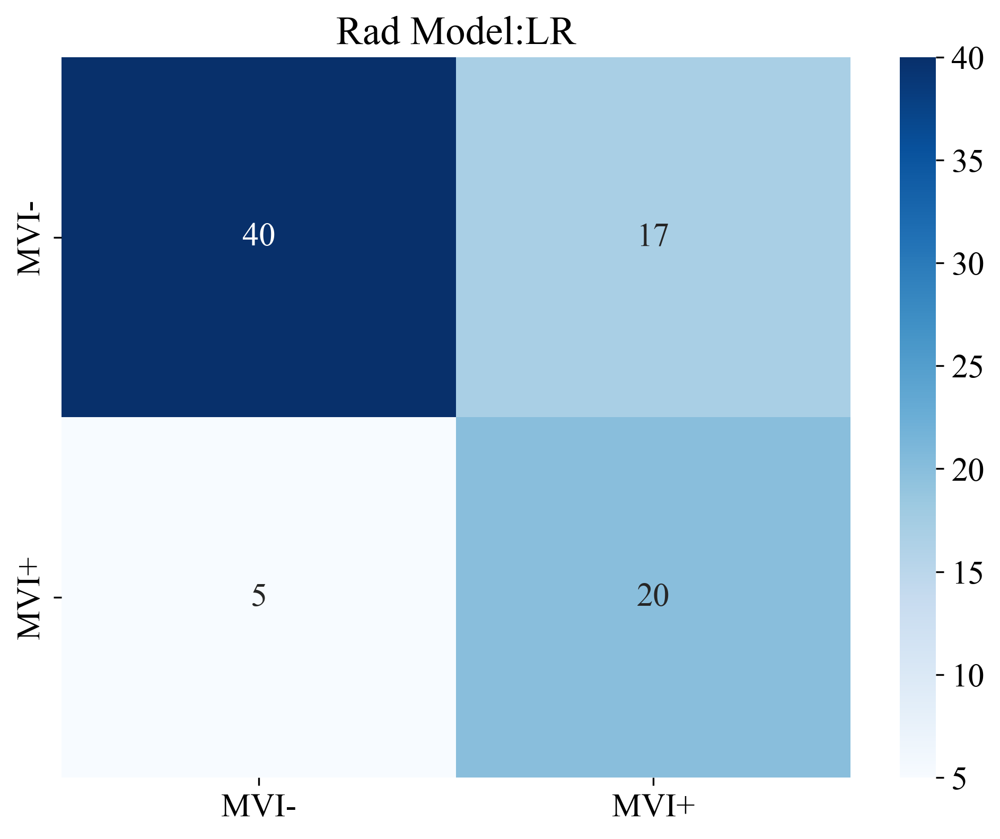

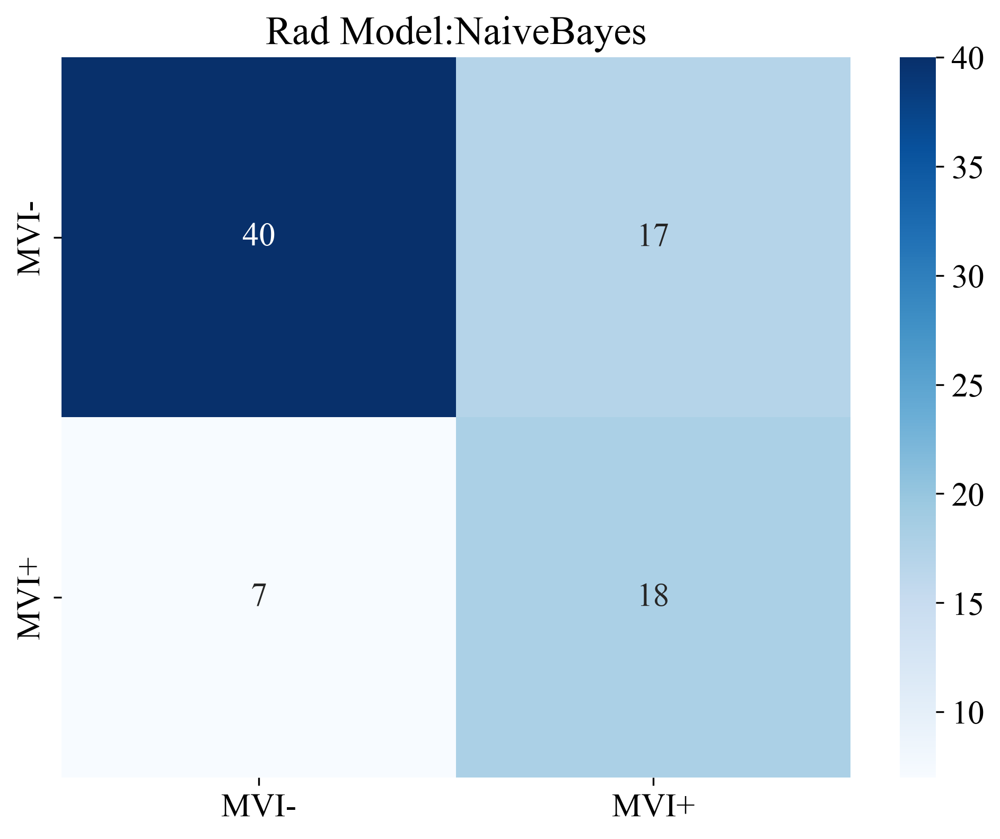

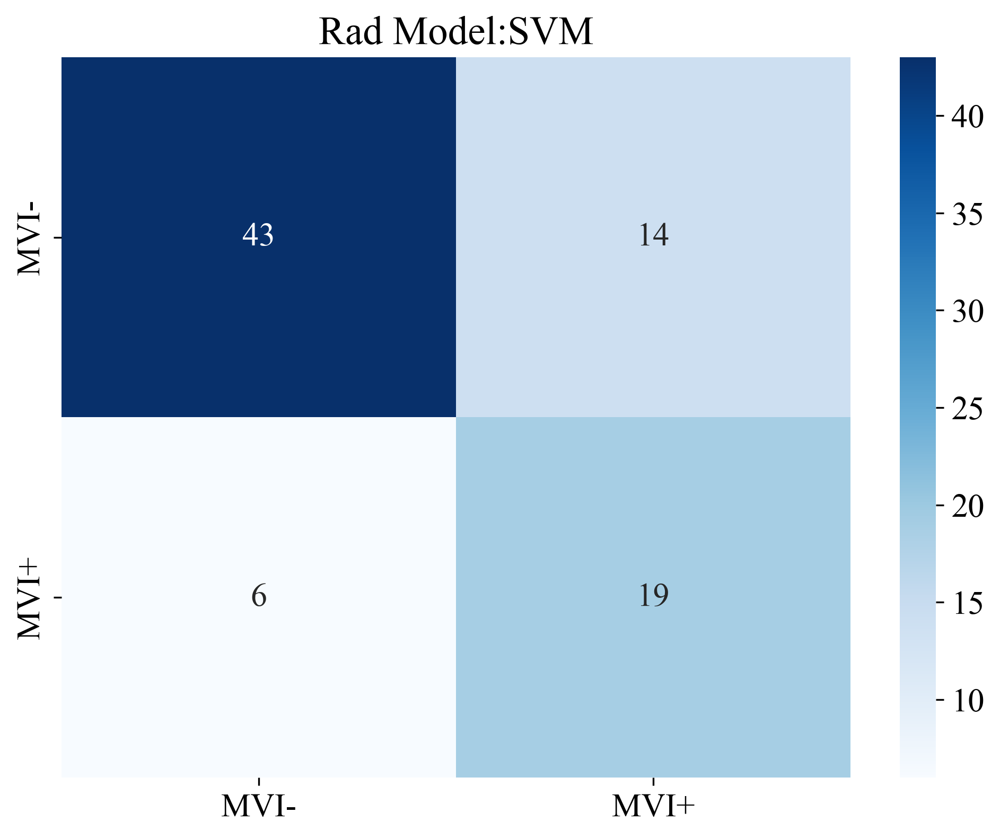

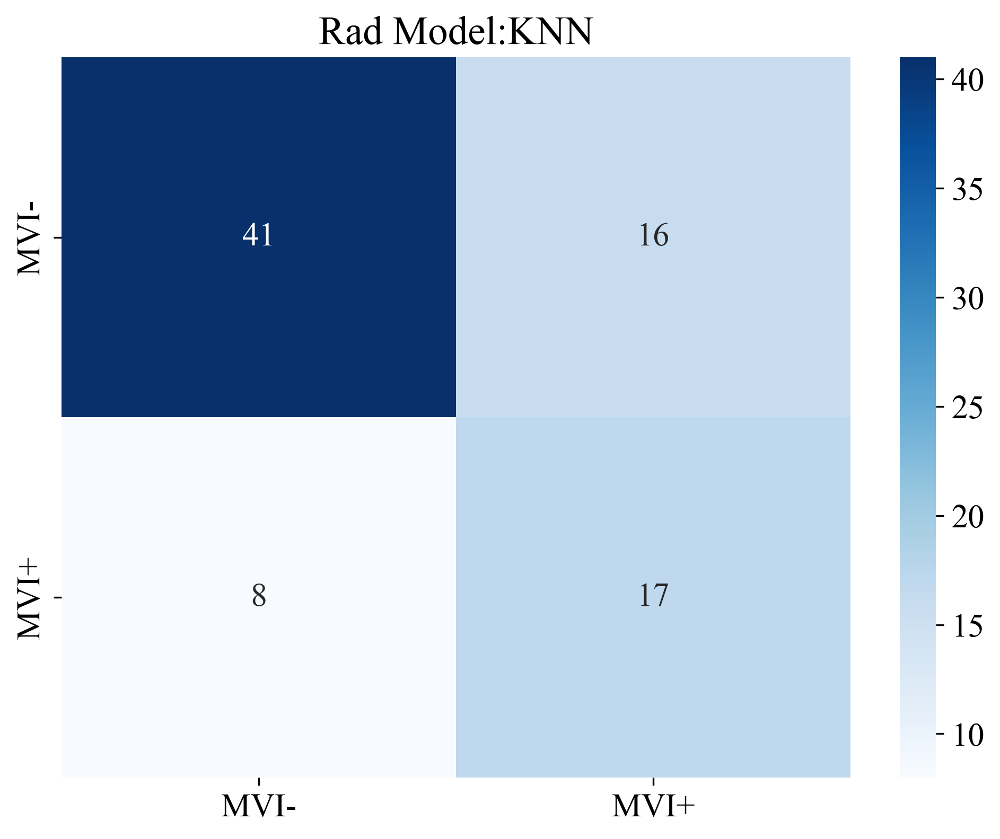

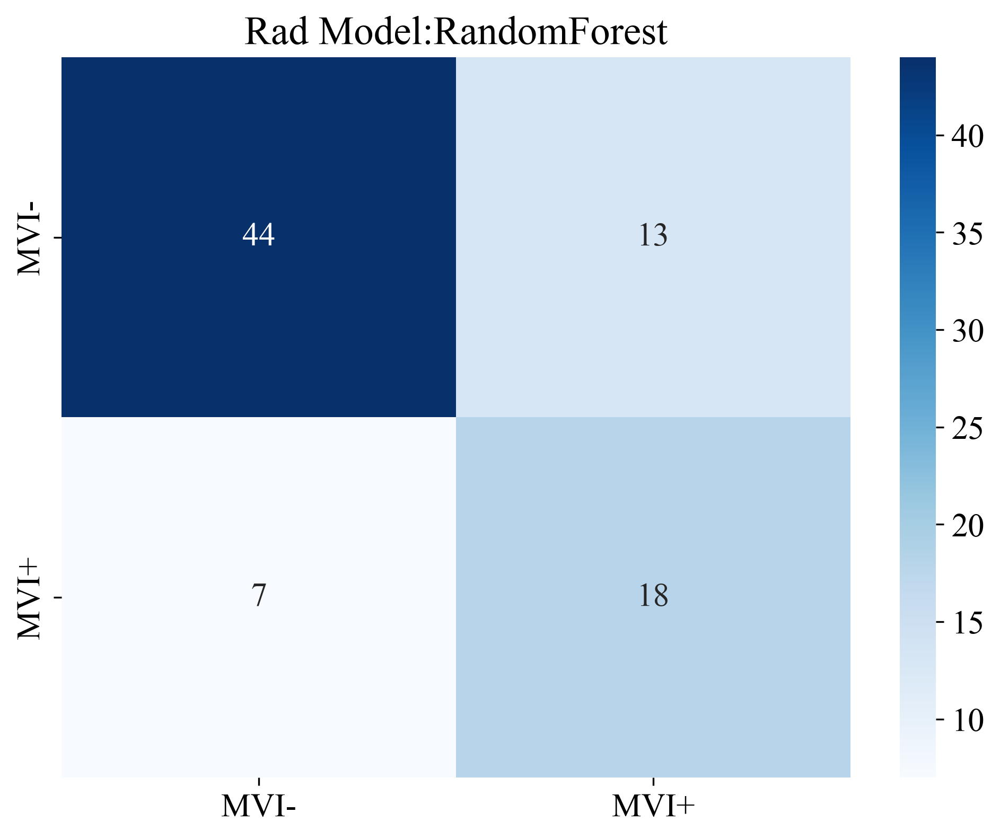

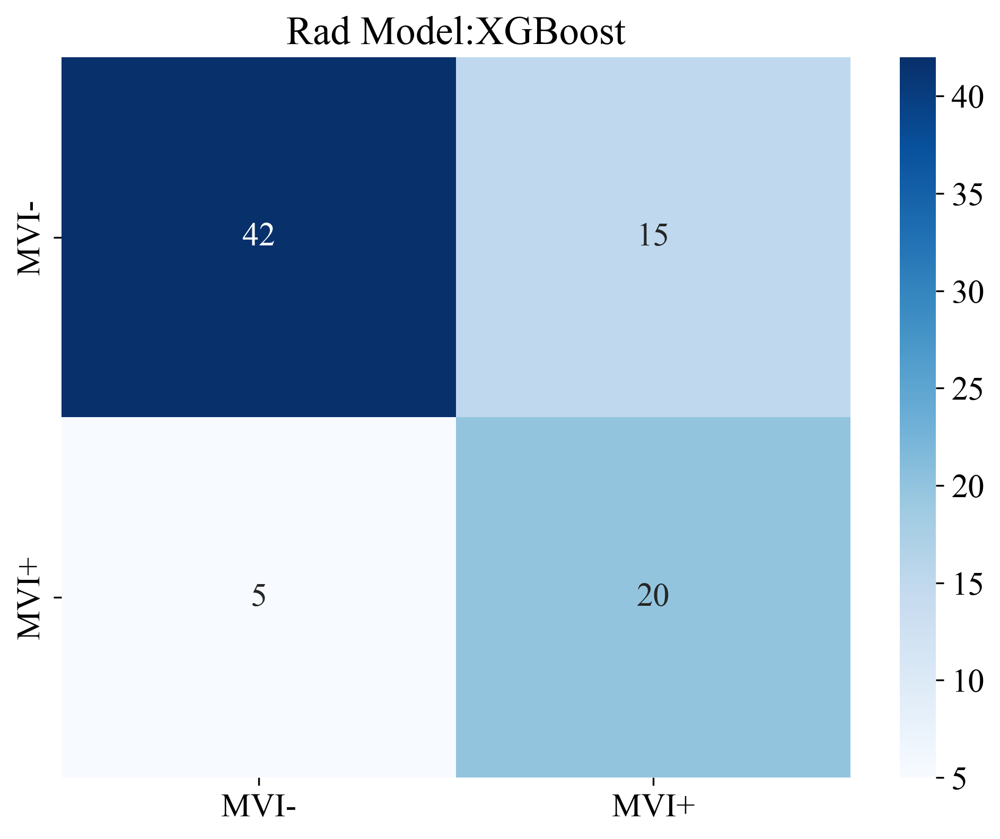

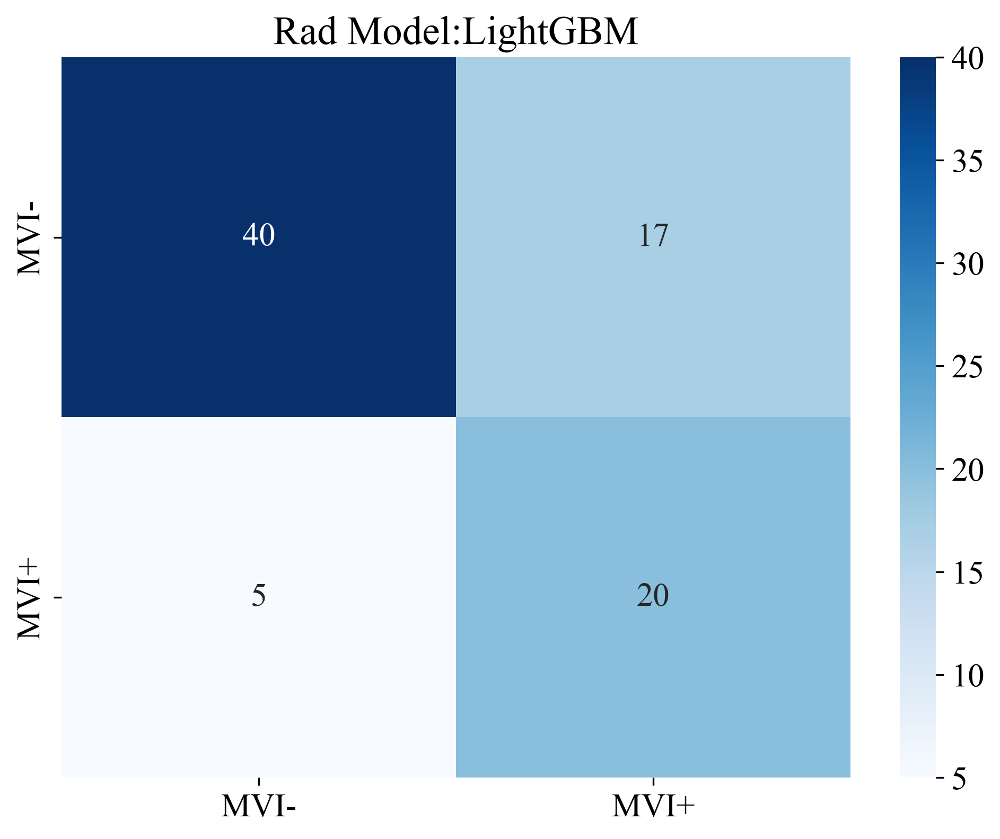

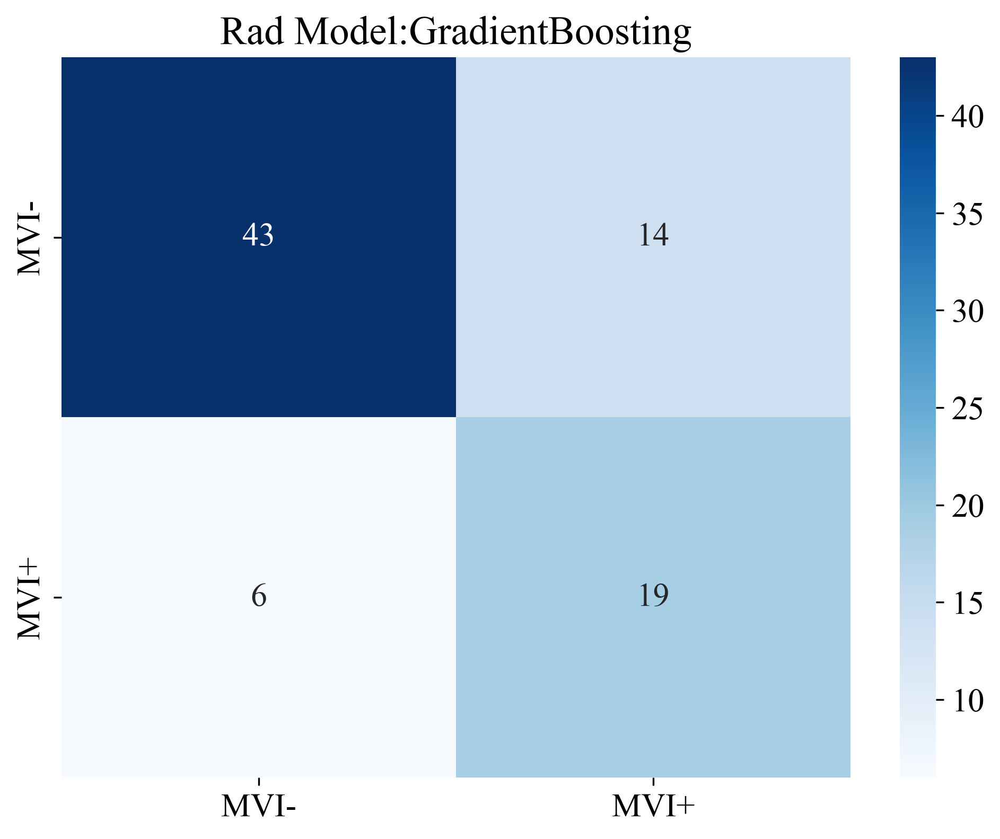

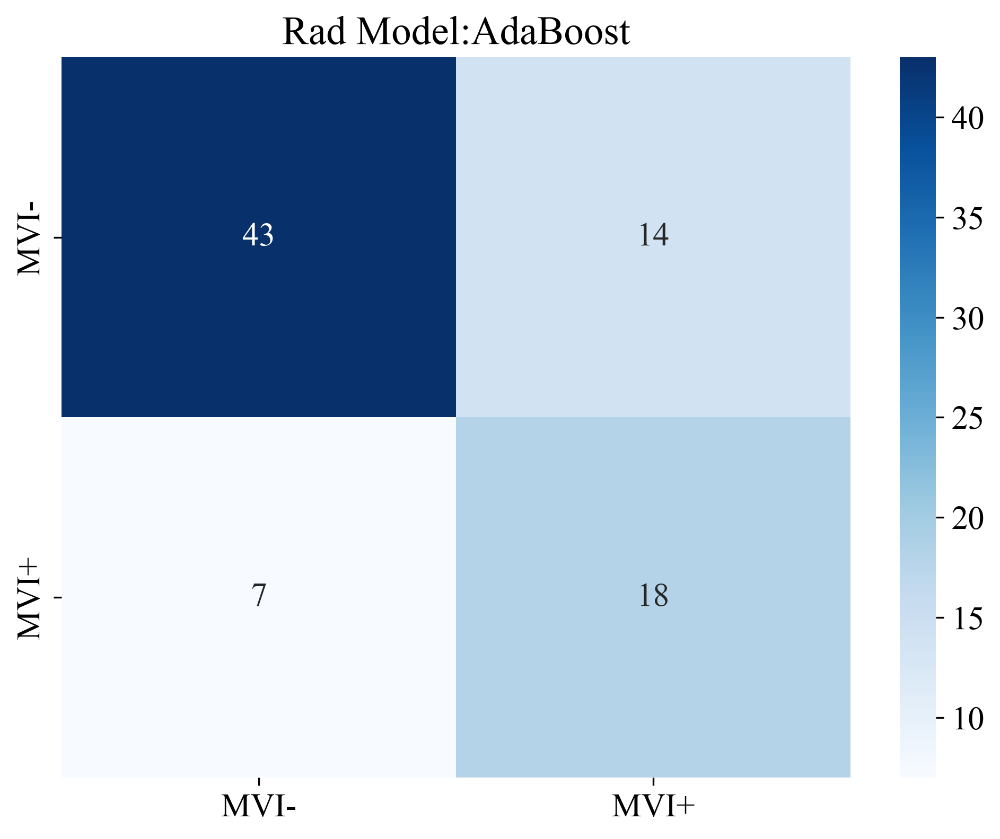

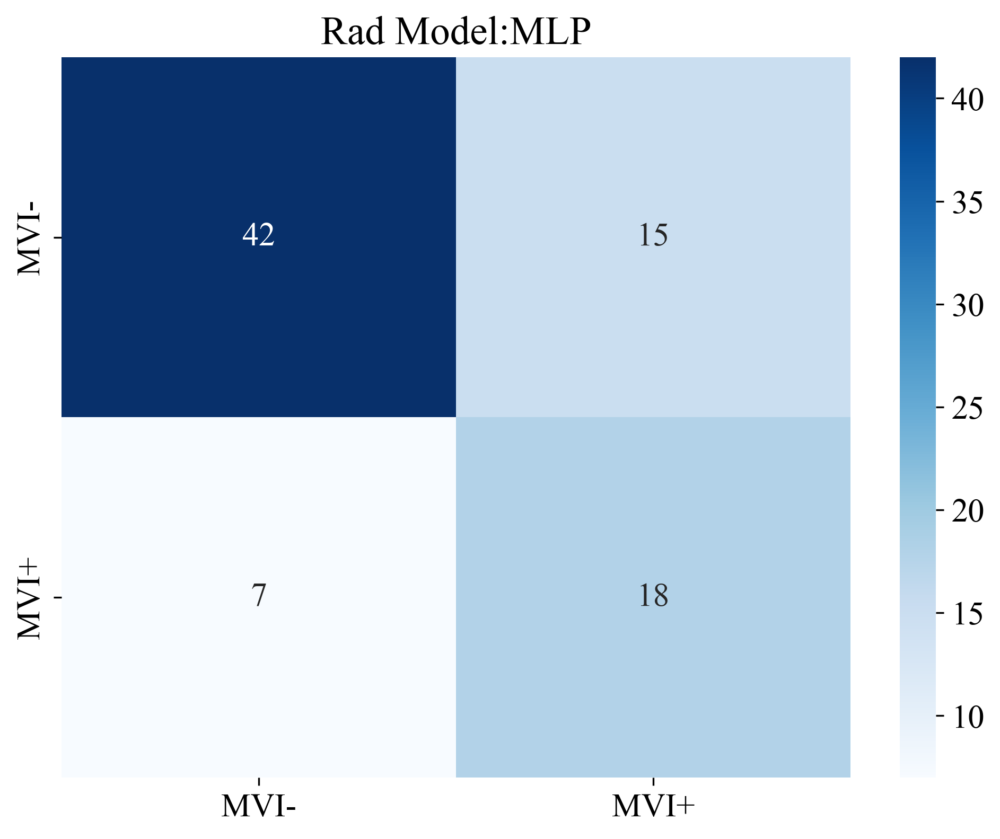

In [32]:
sel_model = model_names
c_matrix = {}

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):
            cm = okcomp.comp1.calc_confusion_matrix(predictions[idx][sel_model_idx][-1], y_test_sel[label],
#                                                     sel_idx = pred_sel_idx[idx][sel_model_idx],
                                                    class_mapping={1:'MVI+', 0:'MVI-'}, num_classes=2)
            c_matrix[label] = cm
            plt.figure(figsize=(8, 6))
            plt.title(f'Rad Model:{sm}')
            
            okcomp.comp1.draw_matrix(cm, norm=False, annot=True, cmap='Blues', fmt='.3g')
            plt.savefig(f'img/model_{sm}_cm.svg', bbox_inches = 'tight')

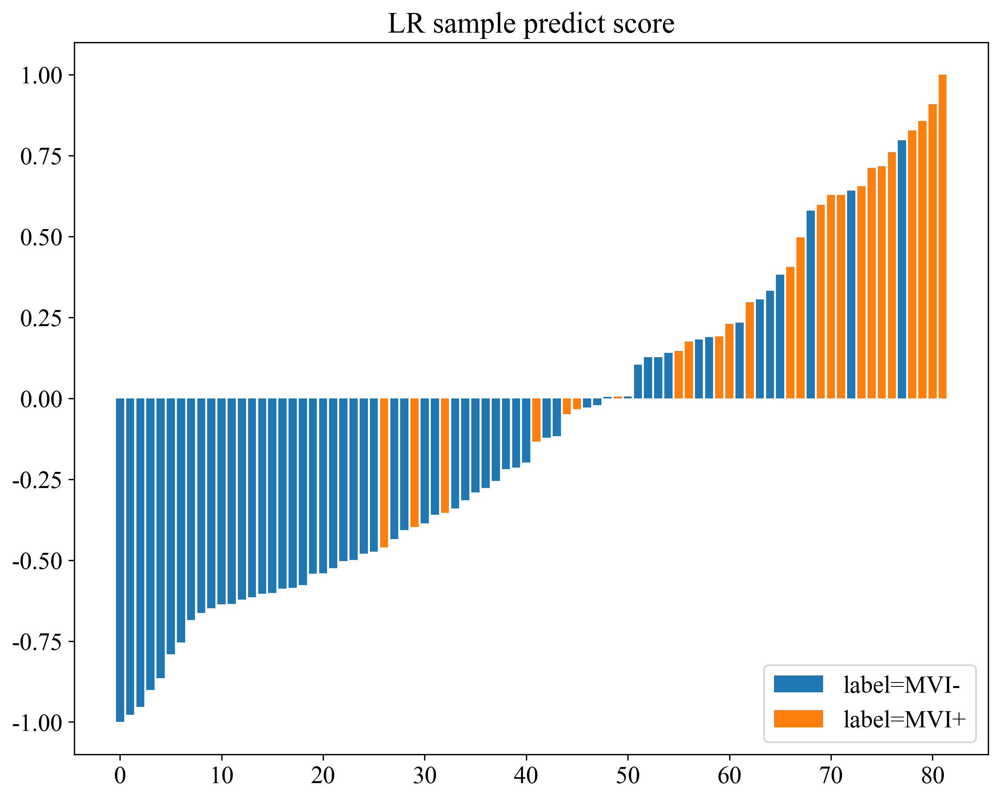

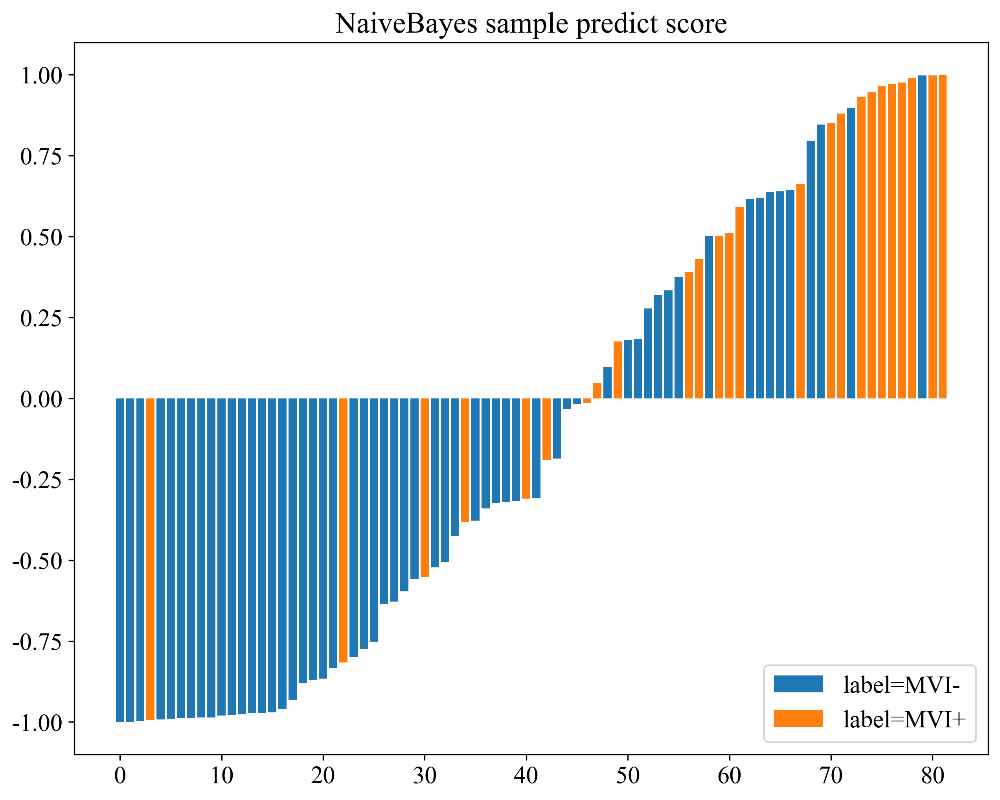

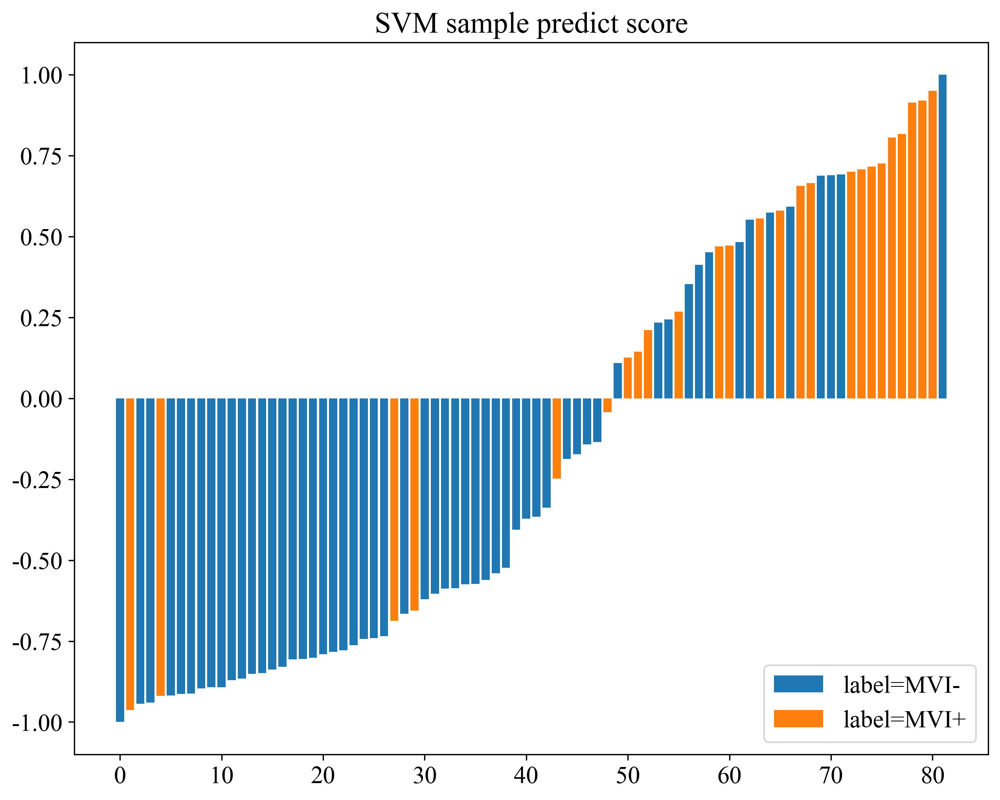

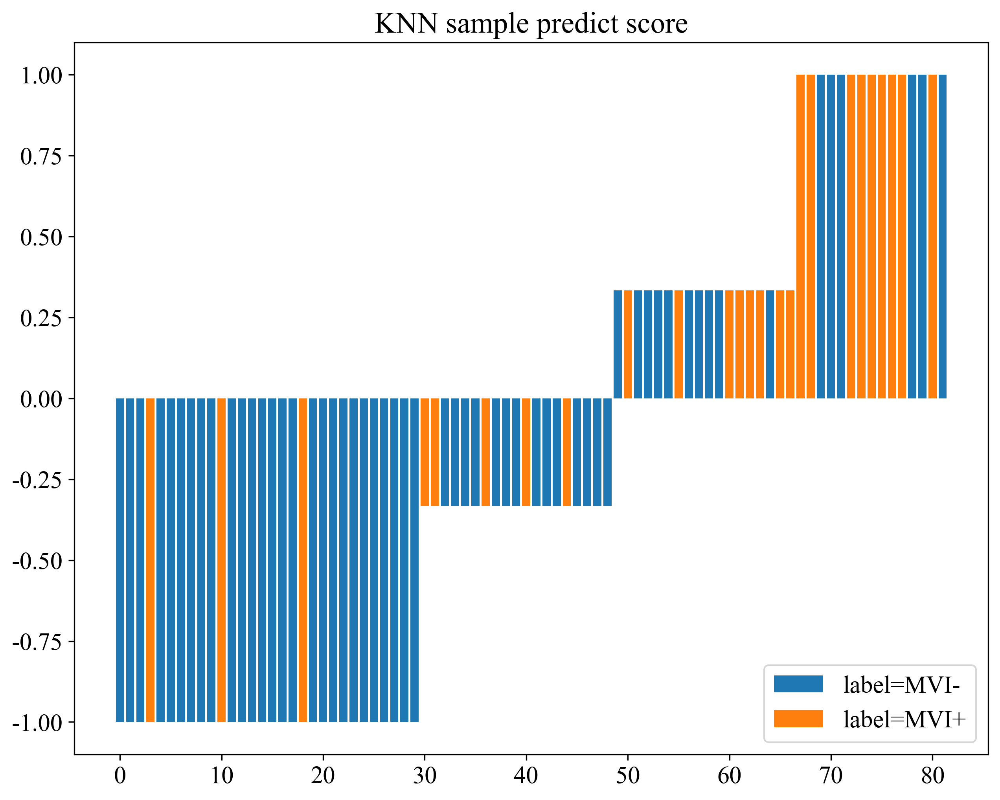

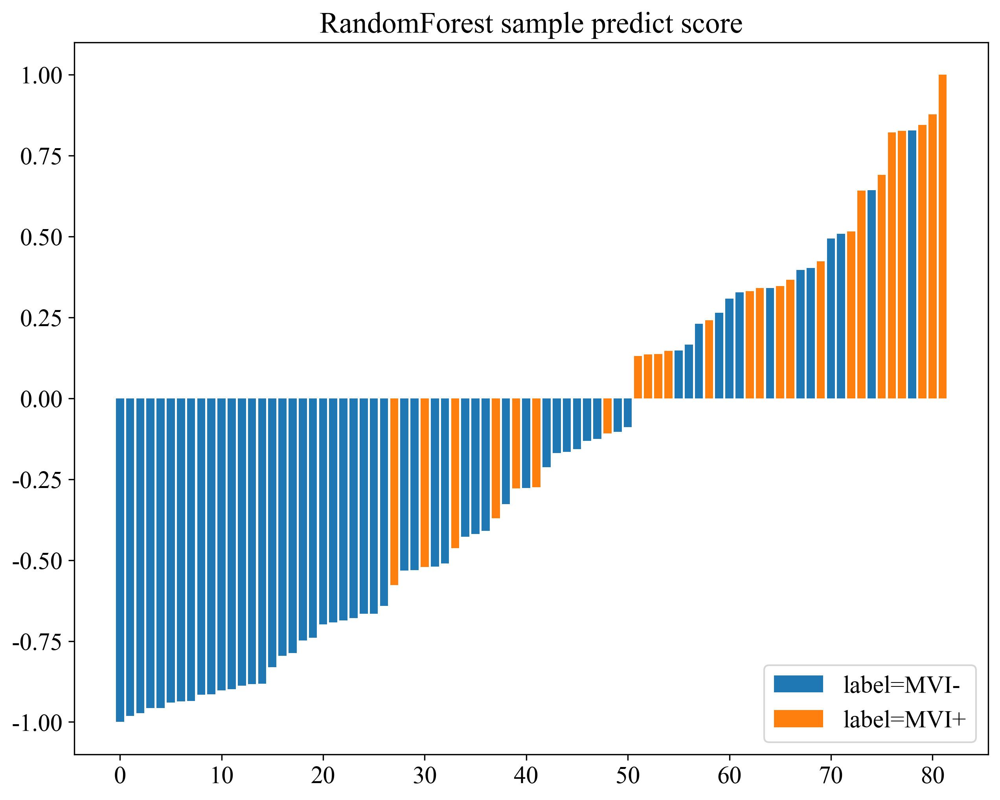

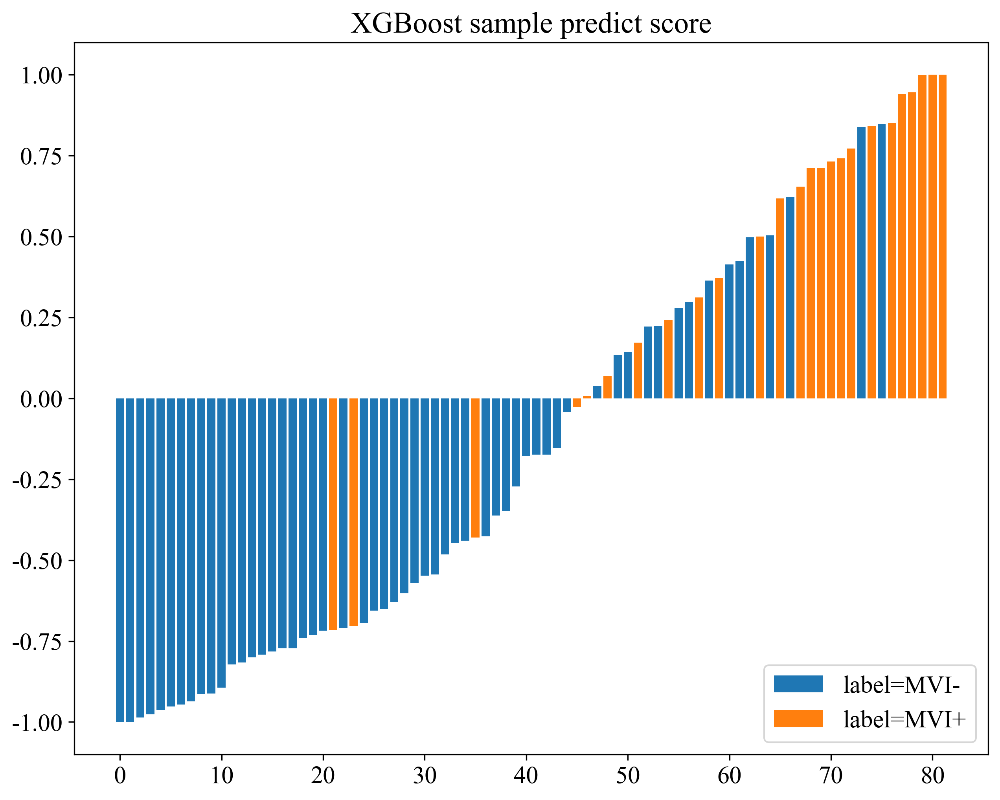

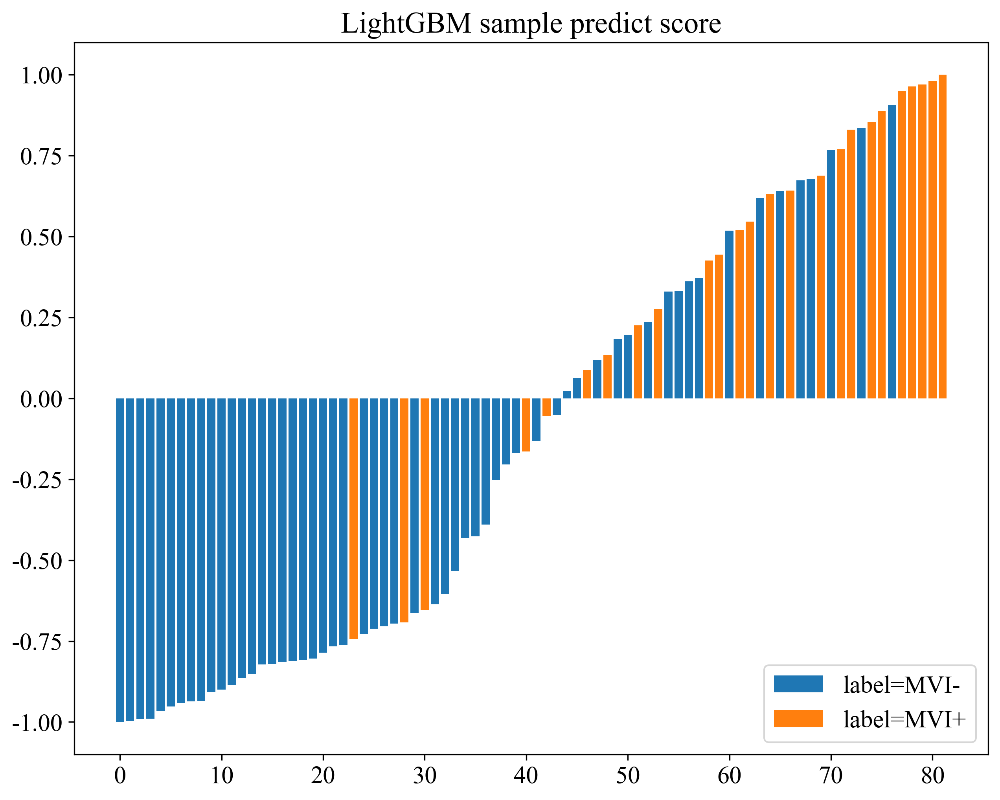

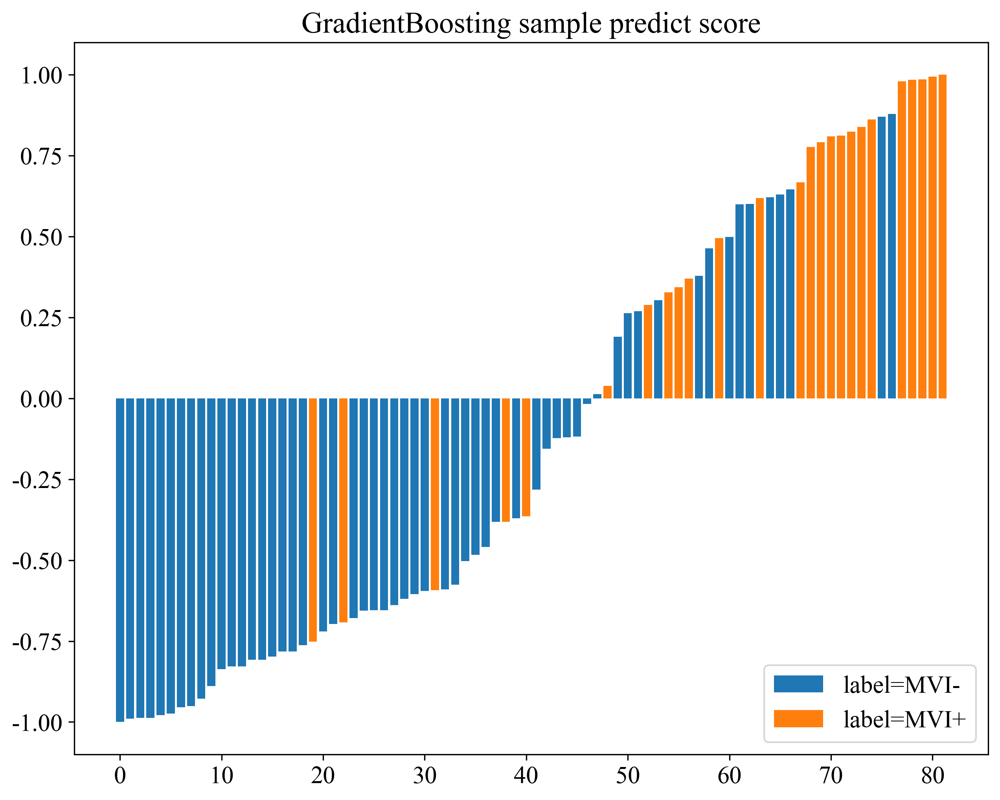

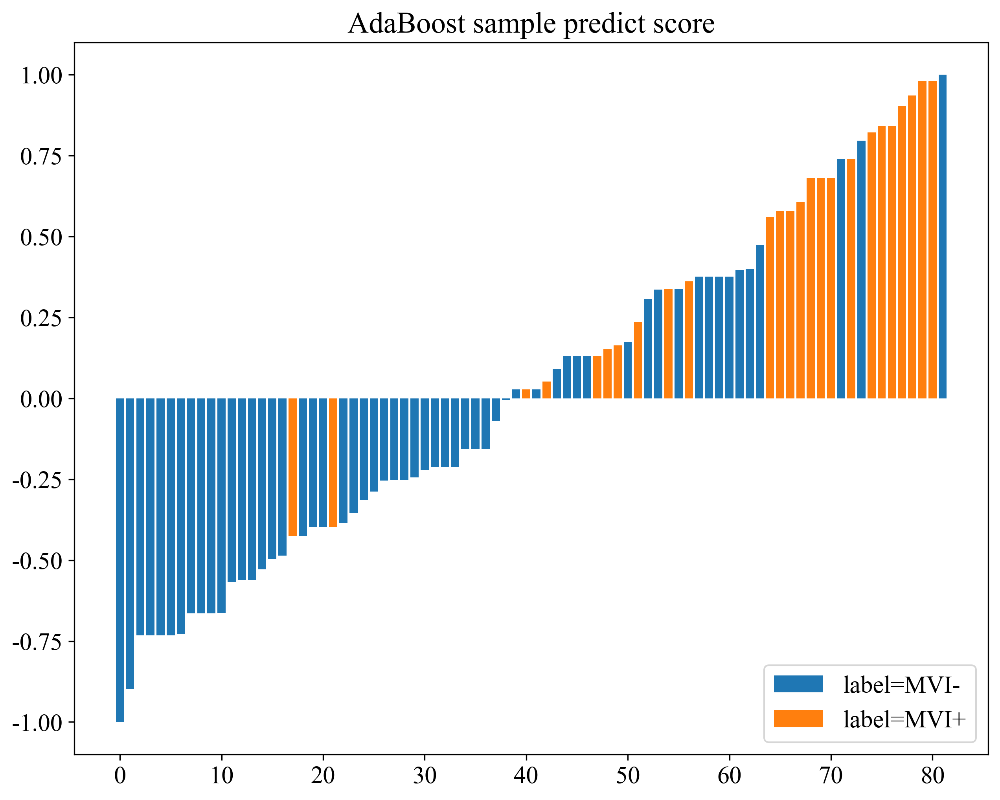

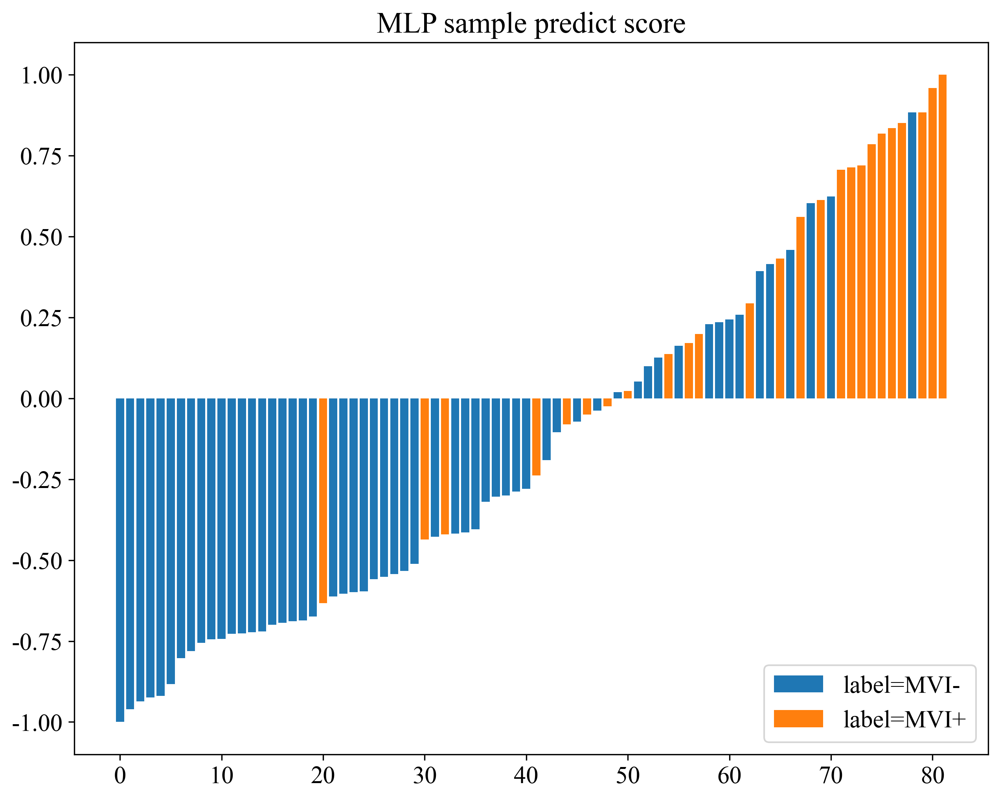

In [33]:
sel_model = model_names
c_matrix = {}

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):            
            okcomp.comp1.draw_predict_score(pred_scores[idx][sel_model_idx][-1], y_test_sel[label])
            plt.title(f'{sm} sample predict score')
            plt.legend(labels=["label=MVI-","label=MVI+"],loc="lower right") 
            plt.savefig(f'img/model_{sm}_sample_dis.svg', bbox_inches = 'tight')
            plt.show()

# Save Model Results
## <span style="font-weight: normal;">Save the predicted labels and the probabilities for each class from the model.</span>

In [34]:
import os
import numpy as np

os.makedirs('results', exist_ok=True)
sel_model = sel_model

for idx, label in enumerate(labels):
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            target = targets[idx][sel_model_idx]
    
            train_indexes = np.reshape(np.array(train_ids), (-1, 1)).astype(str)
            test_indexes = np.reshape(np.array(test_ids), (-1, 1)).astype(str)
            y_train_pred_scores = target.predict_proba(X_train_sel)
            y_test_pred_scores = target.predict_proba(X_test_sel)
            columns = ['ID'] + [f"{label}-{i}"for i in range(y_test_pred_scores.shape[1])]
            
            result_train = pd.DataFrame(np.concatenate([train_indexes, y_train_pred_scores], axis=1), columns=columns)
            result_train.to_csv(f'results/{sm}_Rad_training.csv', index=False)
            result_test = pd.DataFrame(np.concatenate([test_indexes, y_test_pred_scores], axis=1), columns=columns)
            result_test.to_csv(f'results/{sm}_Rad_test.csv', index=False)